# LF Augmentation MF-GP Workflow

This notebook compares MF-GP behavior under three training CSVs: baseline, LF bootstrap augmentation, and LF merged-block augmentation. The HF rows stay fixed in all three cases. The plot display structure mirrors the main MF-GP notebook so the outputs are easy to inspect.


In [1]:
from __future__ import annotations

import json
import os
import sys
from pathlib import Path

import pandas as pd
from IPython.display import Image, display


def find_repo_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    for candidate in [start, *start.parents]:
        if (candidate / "prepare_resum_data.py").exists() and (candidate / "README.md").exists():
            return candidate
    raise RuntimeError("Could not find the XLZD repo root from the current working directory.")

REPO_ROOT = find_repo_root()
os.chdir(REPO_ROOT)

if str(REPO_ROOT / "src" / "run_mfgp") not in sys.path:
    sys.path.insert(0, str(REPO_ROOT / "src" / "run_mfgp"))
if str(REPO_ROOT / "lf_augmentations") not in sys.path:
    sys.path.insert(0, str(REPO_ROOT / "lf_augmentations"))

from lf_augmentation import default_paths
from mfgp_clean_pipeline import load_runtime_config, run_mfgp_transform_suite

PATHS = default_paths()
ARTIFACT_DIR = PATHS.artifact_dir
BASELINE_CONFIG = ARTIFACT_DIR / "settings_baseline.yaml"
BOOTSTRAP_CONFIG = ARTIFACT_DIR / "settings_bootstrap.yaml"
MERGED_CONFIG = ARTIFACT_DIR / "settings_merged.yaml"
BASELINE_CNP_CSV = PATHS.training_cnp_csv
BOOTSTRAP_CNP_CSV = ARTIFACT_DIR / "cnp_augmented_bootstrap_training.csv"
MERGED_CNP_CSV = ARTIFACT_DIR / "cnp_augmented_merged_training.csv"
VALIDATION_CNP_CSV = PATHS.validation_cnp_csv
ITERATION = 0
GRID_POINTS = 120
PREDICT_CHUNK_SIZE = 20000
RANDOM_STATE = 42
TARGET_TRANSFORMS = ["linear", "log_hf", "log_lf", "log_both"]

print(f"Repo root: {REPO_ROOT}")
print(f"Validation CNP CSV: {VALIDATION_CNP_CSV}")
print(f"Target transforms: {TARGET_TRANSFORMS}")


Repo root: /home/klz/Data/XLZD/anpatnaik
Validation CNP CSV: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
Target transforms: ['linear', 'log_hf', 'log_lf', 'log_both']


## 1. Confirm The Baseline And Augmented Artifacts


In [2]:
artifact_table = pd.DataFrame({
    "experiment": ["baseline", "bootstrap", "merged"],
    "lf_mode": ["original only", "original + 3 bootstrap", "original + 3 merged"],
    "config_path": [str(BASELINE_CONFIG), str(BOOTSTRAP_CONFIG), str(MERGED_CONFIG)],
    "training_cnp_csv": [str(BASELINE_CNP_CSV), str(BOOTSTRAP_CNP_CSV), str(MERGED_CNP_CSV)],
})
display(artifact_table)

runtime = load_runtime_config(BASELINE_CONFIG)
display(pd.DataFrame({
    "field": ["version", "theta_headers", "theta_min", "theta_max", "out_dir_cnp", "out_dir_mfgp"],
    "value": [runtime.version, ", ".join(runtime.theta_headers), runtime.theta_min, runtime.theta_max, str(runtime.out_dir_cnp), str(runtime.out_dir_mfgp)],
}))


,experiment,lf_mode,config_path,training_cnp_csv
0,baseline,original only,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...,/home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp...
1,bootstrap,original + 3 bootstrap,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
2,merged,original + 3 merged,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...


,field,value
0,version,xlzd_v1_minibatch_baseline
1,theta_headers,"R_max, Z_max"
2,theta_min,"[0.0, 0.0]"
3,theta_max,"[1500.0, 2000.0]"
4,out_dir_cnp,/home/klz/Data/XLZD/anpatnaik/data/out/cnp
5,out_dir_mfgp,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...


## 2. Run MF-GP On Baseline, Bootstrap, And Merged LF Training Tables


In [3]:
EXPERIMENTS = {
    "baseline": (BASELINE_CONFIG, BASELINE_CNP_CSV),
    "bootstrap": (BOOTSTRAP_CONFIG, BOOTSTRAP_CNP_CSV),
    "merged": (MERGED_CONFIG, MERGED_CNP_CSV),
}

all_mfgp_results = {}
for experiment_name, (config_path, cnp_csv) in EXPERIMENTS.items():
    all_mfgp_results[experiment_name] = run_mfgp_transform_suite(
        config_path=config_path,
        cnp_csv=cnp_csv,
        validation_csv=VALIDATION_CNP_CSV,
        transforms=TARGET_TRANSFORMS,
        iteration=ITERATION,
        grid_points_per_axis=GRID_POINTS,
        random_state=RANDOM_STATE,
        predict_chunk_size=PREDICT_CHUNK_SIZE,
        verbose=True,
    )

EXPERIMENT_TITLES = {
    "linear": "Normal MF-GP",
    "log_hf": "Log HF: emulate log10(y_raw)",
    "log_lf": "Log LF: use log10(y_cnp)",
    "log_both": "Log HF + Log LF: use log10(y_raw) and log10(y_cnp)",
}

PLOT_SELECTIONS = {
    "linear": [
        ("4-fold MF-GP mean/std", "mean_std_plot"),
        ("Interactive 3D mean/std HTML", "mean_std_plot_3d_html"),
        ("Validation 3-sigma: y with linear sigma", "validation_across_theta_linear_plot"),
        ("Validation 3-sigma: log10(y) with linear sigma", "validation_across_theta_log_linear_sigma_plot"),
        ("Validation parity", "validation_parity_linear_plot"),
    ],
    "log_hf": [
        ("4-fold MF-GP mean/std", "mean_std_plot"),
        ("Interactive 3D mean/std HTML", "mean_std_plot_3d_html"),
        ("Validation 3-sigma: log10 target with linear sigma", "validation_across_theta_linear_plot"),
        ("Validation parity", "validation_parity_linear_plot"),
    ],
    "log_lf": [
        ("4-fold MF-GP mean/std", "mean_std_plot"),
        ("Interactive 3D mean/std HTML", "mean_std_plot_3d_html"),
        ("Validation 3-sigma: y with linear sigma", "validation_across_theta_linear_plot"),
        ("Validation 3-sigma: log10(y) with linear sigma", "validation_across_theta_log_linear_sigma_plot"),
        ("Validation parity", "validation_parity_linear_plot"),
    ],
    "log_both": [
        ("4-fold MF-GP mean/std", "mean_std_plot"),
        ("Interactive 3D mean/std HTML", "mean_std_plot_3d_html"),
        ("Validation 3-sigma: log10 target with linear sigma", "validation_across_theta_linear_plot"),
        ("Validation parity", "validation_parity_linear_plot"),
    ],
}



=== Running MF-GP target transform: linear ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_15epochs.csv
[stage] Loading LF/HF training rows...
[data] n_lf=106 n_hf=21 x_dim=2
[data] target_transform=linear use_log_lf=False use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=1.480e+00 hf_sim_noise=1.070e-02 alpha_lf=1.480e+00 alpha_hf=1.070e-10
[fit] Training LF GP...
[fit] Estimated rho=1.196557
[fit] Training HF discrepancy GP...
[fit] GP training complete.
[stage] Predicting on HF observations...
[progress] HF predict 21/21
[stage] Predicting on grid (14400 points)...
[progress] Grid predict 14400/14400


/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_baseline | n_lf=106 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.196557
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline
[done] Elapsed: 5.6s

=== Running MF-GP target transform: log_hf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_15epochs.csv
[stage] Loading LF/HF training rows...
[data] n_lf=106 n_hf=21 x_dim=2
[data] target_transform=log_hf use_log_lf=False use_log_hf=True eps=1.542e-09
[data] lf_cnp_noise=1.480e+00 hf_sim_noise=2.923e+00 alpha_lf=1.480e+00 alpha_hf=2.923e-08
[fit] Training LF GP...
[fit] Estimated rho=-118.690389
[fit] Training HF discrepancy GP...
[fit] GP training comp

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_baseline | n_lf=106 n_hf=21
[done] HF metrics: RMSE=0.000001, MAE=0.000001, R2=1.000000, rho=-118.690389
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline
[done] Elapsed: 1.2s

=== Running MF-GP target transform: log_lf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_15epochs.csv
[stage] Loading LF/HF training rows...
[data] n_lf=106 n_hf=21 x_dim=2
[data] target_transform=log_lf use_log_lf=True use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=8.609e+06 hf_sim_noise=1.070e-02 alpha_lf=8.609e+06 alpha_hf=1.070e-10
[fit] Training LF GP...
[fit] Estimated rho=-0.001194
[fit] Training HF discrepancy GP...
[fit] GP training complete.
[stage] Predicting on HF observations...
[pr

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_baseline | n_lf=106 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=-0.001194
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline
[done] Elapsed: 5.4s

=== Running MF-GP target transform: log_both ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_15epochs.csv
[stage] Loading LF/HF training rows...
[data] n_lf=106 n_hf=21 x_dim=2
[data] target_transform=log_both use_log_lf=True use_log_hf=True eps=1.542e-09
[data] lf_cnp_noise=8.609e+06 hf_sim_noise=2.923e+00 alpha_lf=8.609e+06 alpha_hf=2.923e-08
[fit] Training LF GP...
[fit] Estimated rho=1.292522
[fit] Training HF discrepancy GP...
[fit] GP training com

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_baseline | n_lf=106 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.292522
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline
[done] Elapsed: 1.2s

=== Running MF-GP target transform: linear ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_bootstrap_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=linear use_log_lf=False use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=7.472e-01 hf_sim_noise=1.070e-02 alpha_lf=7.472e-01 alpha_hf=1.070e-10
[fit] Training LF GP...
[fit] Estimated rho=1.058461
[fit] Training HF discrepancy GP...


/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.



[fit] GP training complete.
[stage] Predicting on HF observations...
[progress] HF predict 21/21
[stage] Predicting on grid (14400 points)...
[progress] Grid predict 14400/14400
[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_lfbootstrap | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.058461
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap
[done] Elapsed: 5.5s

=== Running MF-GP target transform: log_hf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_bootstrap_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_hf use_log_lf=False use_log_hf=True eps=1.542e-09
[data] lf_cnp_

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[fit] GP training complete.
[stage] Predicting on HF observations...
[progress] HF predict 21/21
[stage] Predicting on grid (14400 points)...
[progress] Grid predict 14400/14400
[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_lfbootstrap | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000001, MAE=0.000001, R2=1.000000, rho=-64.008096
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap
[done] Elapsed: 1.4s

=== Running MF-GP target transform: log_lf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_bootstrap_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_lf use_log_lf=True use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=4.346e+06 hf_sim_noise=1.070e-02 alpha_lf=4

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_lfbootstrap | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=-0.001194
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap
[done] Elapsed: 5.4s

=== Running MF-GP target transform: log_both ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_bootstrap_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_both use_log_lf=True use_log_hf=True eps=1.542e-09
[data] lf_cnp_noise=4.346e+06 hf_sim_noise=2.923e+00 alpha_lf=4.346e+06 alpha_hf=2.923e-08
[fit] Training LF GP...
[fit] Estimated rho=1.292802
[fit] Training HF discrepancy GP...
[fit] GP

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_lfbootstrap | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.292802
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap
[done] Elapsed: 1.6s

=== Running MF-GP target transform: linear ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_merged_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=linear use_log_lf=False use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=7.435e-01 hf_sim_noise=1.070e-02 alpha_lf=7.435e-01 alpha_hf=1.070e-10
[fit] Training LF GP...
[fit] Estimated rho=1.062718
[fit] Training HF discrepancy GP...
[fit] GP training complete.
[stage] Predicting on HF observations

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.



[progress] Grid predict 14400/14400
[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_lfmerged | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.062718
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged
[done] Elapsed: 5.2s

=== Running MF-GP target transform: log_hf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_merged_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_hf use_log_lf=False use_log_hf=True eps=1.542e-09
[data] lf_cnp_noise=7.435e-01 hf_sim_noise=2.923e+00 alpha_lf=7.435e-01 alpha_hf=2.923e-08
[fit] Training LF GP...
[fit] Estimated rho=-64.274153
[fit] Training HF d

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[progress] Grid predict 14400/14400
[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_lfmerged | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000001, MAE=0.000001, R2=1.000000, rho=-64.274153
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged
[done] Elapsed: 1.3s

=== Running MF-GP target transform: log_lf ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_merged_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_lf use_log_lf=True use_log_hf=False eps=1.542e-09
[data] lf_cnp_noise=4.326e+06 hf_sim_noise=1.070e-02 alpha_lf=4.326e+06 alpha_hf=1.070e-10
[fit] Training LF GP...
[fit] Estimated rho=-0.001194
[fit] Training HF discrepancy GP...
[fit] GP training complete.
[stag

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] Generated theta-group uncertainty plots: 42
[done] MFGP complete | version=xlzd_v1_minibatch_lfmerged | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=-0.001194
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged
[done] Elapsed: 5.6s

=== Running MF-GP target transform: log_both ===
[stage] Loading runtime config...
[stage] Using CNP CSV: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/cnp_augmented_merged_training.csv
[stage] Loading LF/HF training rows...
[data] n_lf=212 n_hf=21 x_dim=2
[data] target_transform=log_both use_log_lf=True use_log_hf=True eps=1.542e-09
[data] lf_cnp_noise=4.326e+06 hf_sim_noise=2.923e+00 alpha_lf=4.326e+06 alpha_hf=2.923e-08
[fit] Training LF GP...
[fit] Estimated rho=1.292526
[fit] Training HF discrepancy GP...
[fit] GP training

/home/liuser/miniconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.



[stage] Loading validation CSV for extra plots: /home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp_xlzd_v1_minibatch_output_validation_15epochs.csv
[done] MFGP complete | version=xlzd_v1_minibatch_lfmerged | n_lf=212 n_hf=21
[done] HF metrics: RMSE=0.000000, MAE=0.000000, R2=1.000000, rho=1.292526
[done] Outputs -> /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged
[done] Elapsed: 1.2s


## 3. Inspect Metrics And CSV Outputs


In [4]:
metric_rows = []
artifact_rows = []
for experiment_name, transform_map in all_mfgp_results.items():
    for mode, result in transform_map.items():
        metrics = json.loads(Path(result.metrics_json).read_text())
        metric_rows.append({"experiment": experiment_name, "mode": mode, **metrics})
        artifact_rows.extend([
            {"experiment": experiment_name, "mode": mode, "artifact": "cnp_csv", "path": str(result.cnp_csv)},
            {"experiment": experiment_name, "mode": mode, "artifact": "model_json", "path": str(result.model_json)},
            {"experiment": experiment_name, "mode": mode, "artifact": "metrics_json", "path": str(result.metrics_json)},
            {"experiment": experiment_name, "mode": mode, "artifact": "prediction_csv", "path": str(result.prediction_csv)},
            {"experiment": experiment_name, "mode": mode, "artifact": "grid_csv", "path": str(result.grid_csv)},
        ])
        for label, attr in PLOT_SELECTIONS[mode]:
            plot_path = getattr(result, attr)
            artifact_rows.append({"experiment": experiment_name, "mode": mode, "artifact": label, "path": str(plot_path) if plot_path else None})

metrics_df = pd.DataFrame(metric_rows)
display(metrics_df)
display(pd.DataFrame(artifact_rows))

for experiment_name, transform_map in all_mfgp_results.items():
    for mode, result in transform_map.items():
        print(f"\n=== {experiment_name} | {mode} prediction CSV preview ===")
        display(pd.read_csv(result.prediction_csv).head())
        print(f"=== {experiment_name} | {mode} grid CSV preview ===")
        display(pd.read_csv(result.grid_csv).head())


,experiment,mode,rmse_hf,mae_hf,r2_hf,n_lf,n_hf,rho,target_transform,target_transform_eps
0,baseline,linear,4.334995e-12,2.715301e-12,1.0,106,21,1.196557,linear,1.542454e-09
1,baseline,log_hf,7.103794e-07,5.818475e-07,1.0,106,21,-118.690389,log_hf,1.542454e-09
2,baseline,log_lf,6.674657e-12,4.892536e-12,1.0,106,21,-0.001194,log_lf,1.542454e-09
3,baseline,log_both,4.829097e-07,3.946262e-07,1.0,106,21,1.292522,log_both,1.542454e-09
4,bootstrap,linear,5.271367e-11,3.701795e-11,1.0,212,21,1.058461,linear,1.542454e-09
5,bootstrap,log_hf,6.509688e-07,5.346511e-07,1.0,212,21,-64.008096,log_hf,1.542454e-09
6,bootstrap,log_lf,6.674667e-12,4.892553e-12,1.0,212,21,-0.001194,log_lf,1.542454e-09
7,bootstrap,log_both,4.829174e-07,3.946321e-07,1.0,212,21,1.292802,log_both,1.542454e-09
8,merged,linear,1.484835e-11,1.050468e-11,1.0,212,21,1.062718,linear,1.542454e-09
9,merged,log_hf,6.510339e-07,5.348357e-07,1.0,212,21,-64.274153,log_hf,1.542454e-09


,experiment,mode,artifact,path
0,baseline,linear,cnp_csv,/home/klz/Data/XLZD/anpatnaik/data/out/cnp/cnp...
1,baseline,linear,model_json,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
2,baseline,linear,metrics_json,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
3,baseline,linear,prediction_csv,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
4,baseline,linear,grid_csv,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
...,...,...,...,...
109,merged,log_both,grid_csv,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
110,merged,log_both,4-fold MF-GP mean/std,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
111,merged,log_both,Interactive 3D mean/std HTML,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
112,merged,log_both,Validation 3-sigma: log10 target with linear s...,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...



=== baseline | linear prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1.0,0.0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,linear,1.542454e-09,5.424747e-13,0.009994
1,96.014145,1099.838135,1.0,0.0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,linear,1.542454e-09,-3.501032e-13,0.009899
2,249.597168,1613.876343,1.0,0.0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,linear,1.542454e-09,1.380126e-04,0.010716
3,283.093903,931.364197,1.0,0.0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,linear,1.542454e-09,-5.428045e-13,0.008309
4,290.787292,1543.266357,1.0,0.0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,linear,1.542454e-09,2.957413e-05,0.009906


=== baseline | linear grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,linear,1.542454e-09,0.001720,0.017538,0.000894,0.013017
1,12.605042,0.0,linear,1.542454e-09,0.001648,0.017187,0.000828,0.012694
2,25.210084,0.0,linear,1.542454e-09,0.001579,0.016856,0.000766,0.012390
3,37.815126,0.0,linear,1.542454e-09,0.001512,0.016548,0.000705,0.012106
4,50.420168,0.0,linear,1.542454e-09,0.001450,0.016263,0.000647,0.011843



=== baseline | log_hf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1.0,0.0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.991310
1,96.014145,1099.838135,1.0,0.0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.981916
2,249.597168,1613.876343,1.0,0.0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_hf,1.542454e-09,-3.860082,1.062919
3,283.093903,931.364197,1.0,0.0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.824196
4,290.787292,1543.266357,1.0,0.0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_hf,1.542454e-09,-4.529087,0.982651


=== baseline | log_hf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_hf,1.542454e-09,-6.994070,3.412942,0.000894,0.013017
1,12.605042,0.0,log_hf,1.542454e-09,-6.999251,3.367109,0.000828,0.012694
2,25.210084,0.0,log_hf,1.542454e-09,-7.004527,3.321927,0.000766,0.012390
3,37.815126,0.0,log_hf,1.542454e-09,-7.009900,3.277438,0.000705,0.012106
4,50.420168,0.0,log_hf,1.542454e-09,-7.015364,3.233671,0.000647,0.011843



=== baseline | log_lf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1.0,0.0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,log_lf,1.542454e-09,8.099623e-13,0.00075
1,96.014145,1099.838135,1.0,0.0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,log_lf,1.542454e-09,6.199034e-15,0.00075
2,249.597168,1613.876343,1.0,0.0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,log_lf,1.542454e-09,1.380126e-04,0.00075
3,283.093903,931.364197,1.0,0.0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,log_lf,1.542454e-09,-5.726652e-13,0.00075
4,290.787292,1543.266357,1.0,0.0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,log_lf,1.542454e-09,2.957413e-05,0.00075


=== baseline | log_lf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_lf,1.542454e-09,0.006472,0.014231,-4.395822,0.628132
1,12.605042,0.0,log_lf,1.542454e-09,0.006491,0.014179,-4.395822,0.628132
2,25.210084,0.0,log_lf,1.542454e-09,0.006510,0.014127,-4.395822,0.628132
3,37.815126,0.0,log_lf,1.542454e-09,0.006530,0.014074,-4.395822,0.628132
4,50.420168,0.0,log_lf,1.542454e-09,0.006550,0.014021,-4.395822,0.628132



=== baseline | log_both prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1.0,0.0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811874
1,96.014145,1099.838135,1.0,0.0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811874
2,249.597168,1613.876343,1.0,0.0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_both,1.542454e-09,-3.860082,0.811874
3,283.093903,931.364197,1.0,0.0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811874
4,290.787292,1543.266357,1.0,0.0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_both,1.542454e-09,-4.529088,0.811874


=== baseline | log_both grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_both,1.542454e-09,-6.722798,2.562774,-4.395822,0.628132
1,12.605042,0.0,log_both,1.542454e-09,-6.730695,2.545629,-4.395822,0.628132
2,25.210084,0.0,log_both,1.542454e-09,-6.738234,2.528100,-4.395822,0.628132
3,37.815126,0.0,log_both,1.542454e-09,-6.745388,2.510197,-4.395822,0.628132
4,50.420168,0.0,log_both,1.542454e-09,-6.752125,2.491928,-4.395822,0.628132



=== bootstrap | linear prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,linear,1.542454e-09,-9.380555e-11,0.007855
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,linear,1.542454e-09,4.825208e-13,0.008205
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,linear,1.542454e-09,1.380126e-04,0.007741
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,linear,1.542454e-09,7.790953e-11,0.005954
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,linear,1.542454e-09,2.957413e-05,0.007096


=== bootstrap | linear grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,linear,1.542454e-09,0.000407,0.021401,0.000091,0.020077
1,12.605042,0.0,linear,1.542454e-09,0.000398,0.020611,0.000082,0.019325
2,25.210084,0.0,linear,1.542454e-09,0.000388,0.019846,0.000073,0.018597
3,37.815126,0.0,linear,1.542454e-09,0.000379,0.019108,0.000064,0.017894
4,50.420168,0.0,linear,1.542454e-09,0.000370,0.018400,0.000056,0.017218



=== bootstrap | log_hf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.475032
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.496150
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_hf,1.542454e-09,-3.860082,0.468121
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.360065
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_hf,1.542454e-09,-4.529087,0.429103


=== bootstrap | log_hf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_hf,1.542454e-09,-6.787132,3.180627,0.000091,0.020077
1,12.605042,0.0,log_hf,1.542454e-09,-6.794272,3.135519,0.000082,0.019325
2,25.210084,0.0,log_hf,1.542454e-09,-6.801080,3.090904,0.000073,0.018597
3,37.815126,0.0,log_hf,1.542454e-09,-6.807535,3.046797,0.000064,0.017894
4,50.420168,0.0,log_hf,1.542454e-09,-6.813613,3.003216,0.000056,0.017218



=== bootstrap | log_lf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,log_lf,1.542454e-09,8.099892e-13,0.00075
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,log_lf,1.542454e-09,6.178218e-15,0.00075
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,log_lf,1.542454e-09,1.380126e-04,0.00075
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,log_lf,1.542454e-09,-5.727745e-13,0.00075
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,log_lf,1.542454e-09,2.957413e-05,0.00075


=== bootstrap | log_lf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_lf,1.542454e-09,0.006472,0.014231,-4.394871,0.627721
1,12.605042,0.0,log_lf,1.542454e-09,0.006491,0.014179,-4.394871,0.627721
2,25.210084,0.0,log_lf,1.542454e-09,0.006510,0.014127,-4.394871,0.627721
3,37.815126,0.0,log_lf,1.542454e-09,0.006530,0.014074,-4.394871,0.627721
4,50.420168,0.0,log_lf,1.542454e-09,0.006550,0.014021,-4.394871,0.627721



=== bootstrap | log_both prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811519
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811519
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_both,1.542454e-09,-3.860082,0.811519
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.811519
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_both,1.542454e-09,-4.529088,0.811519


=== bootstrap | log_both grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_both,1.542454e-09,-6.722801,2.562657,-4.394871,0.627721
1,12.605042,0.0,log_both,1.542454e-09,-6.730698,2.545511,-4.394871,0.627721
2,25.210084,0.0,log_both,1.542454e-09,-6.738237,2.527981,-4.394871,0.627721
3,37.815126,0.0,log_both,1.542454e-09,-6.745391,2.510077,-4.394871,0.627721
4,50.420168,0.0,log_both,1.542454e-09,-6.752128,2.491807,-4.394871,0.627721



=== merged | linear prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,linear,1.542454e-09,-2.502969e-11,0.007864
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,linear,1.542454e-09,1.478712e-13,0.008210
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,linear,1.542454e-09,1.380126e-04,0.007751
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,linear,1.542454e-09,2.091259e-11,0.005970
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,linear,1.542454e-09,2.957413e-05,0.007109


=== merged | linear grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,linear,1.542454e-09,0.000384,0.021471,0.000093,0.020071
1,12.605042,0.0,linear,1.542454e-09,0.000374,0.020673,0.000084,0.019315
2,25.210084,0.0,linear,1.542454e-09,0.000364,0.019901,0.000075,0.018583
3,37.815126,0.0,linear,1.542454e-09,0.000355,0.019157,0.000066,0.017877
4,50.420168,0.0,linear,1.542454e-09,0.000346,0.018441,0.000057,0.017198



=== merged | log_hf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.475621
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.496570
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_hf,1.542454e-09,-3.860082,0.468786
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_hf,1.542454e-09,-8.811788,0.361079
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_hf,1.542454e-09,-4.529087,0.429943


=== merged | log_hf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_hf,1.542454e-09,-6.787096,3.184460,0.000093,0.020071
1,12.605042,0.0,log_hf,1.542454e-09,-6.794221,3.139109,0.000084,0.019315
2,25.210084,0.0,log_hf,1.542454e-09,-6.801014,3.094268,0.000075,0.018583
3,37.815126,0.0,log_hf,1.542454e-09,-6.807455,3.049950,0.000066,0.017877
4,50.420168,0.0,log_hf,1.542454e-09,-6.813518,3.006175,0.000057,0.017198



=== merged | log_lf prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,0.000000,101440.0,0.000000,log_lf,1.542454e-09,8.100057e-13,0.00075
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,0.000000,101440.0,0.000000,log_lf,1.542454e-09,6.217249e-15,0.00075
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,0.000138,101440.0,0.000138,log_lf,1.542454e-09,1.380126e-04,0.00075
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,0.000000,101440.0,0.000000,log_lf,1.542454e-09,-5.727484e-13,0.00075
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,0.000030,101440.0,0.000030,log_lf,1.542454e-09,2.957413e-05,0.00075


=== merged | log_lf grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_lf,1.542454e-09,0.006472,0.014231,-4.395807,0.628233
1,12.605042,0.0,log_lf,1.542454e-09,0.006491,0.014179,-4.395807,0.628233
2,25.210084,0.0,log_lf,1.542454e-09,0.006510,0.014127,-4.395807,0.628233
3,37.815126,0.0,log_lf,1.542454e-09,0.006530,0.014074,-4.395807,0.628233
4,50.420168,0.0,log_lf,1.542454e-09,0.006550,0.014021,-4.395807,0.628233



=== merged | log_both prediction CSV preview ===


,R_max,Z_max,fidelity,iteration,y_cnp,y_cnp_err,y_raw,n_samples_agg,y_raw_original,target_transform,target_transform_eps,mf_mean,mf_std
0,66.217117,925.747437,1,0,1.373391e-07,1.847002,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.812008
1,96.014145,1099.838135,1,0,4.443017e-07,1.746930,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.812008
2,249.597168,1613.876343,1,0,7.251262e-05,1.415927,-3.860081,101440.0,0.000138,log_both,1.542454e-09,-3.860082,0.812008
3,283.093903,931.364197,1,0,4.451077e-07,1.687108,-8.811788,101440.0,0.000000,log_both,1.542454e-09,-8.811788,0.812008
4,290.787292,1543.266357,1,0,4.235418e-05,1.415786,-4.529088,101440.0,0.000030,log_both,1.542454e-09,-4.529088,0.812008


=== merged | log_both grid CSV preview ===


,R_max,Z_max,target_transform,target_transform_eps,mf_mean,mf_std,lf_mean,lf_std
0,0.000000,0.0,log_both,1.542454e-09,-6.722801,2.562812,-4.395807,0.628233
1,12.605042,0.0,log_both,1.542454e-09,-6.730698,2.545667,-4.395807,0.628233
2,25.210084,0.0,log_both,1.542454e-09,-6.738237,2.528139,-4.395807,0.628233
3,37.815126,0.0,log_both,1.542454e-09,-6.745391,2.510235,-4.395807,0.628233
4,50.420168,0.0,log_both,1.542454e-09,-6.752128,2.491967,-4.395807,0.628233


## 4. Plot Display Helpers


In [5]:
def display_selected_mfgp_plots(experiment_name: str, mode: str) -> None:
    result = all_mfgp_results[experiment_name][mode]
    print(f"{experiment_name}: {EXPERIMENT_TITLES[mode]}")
    for label, attr in PLOT_SELECTIONS[mode]:
        plot_path = getattr(result, attr)
        if plot_path is None:
            continue
        plot_path = Path(plot_path)
        if not plot_path.exists():
            print(f"[missing] {label}: {plot_path}")
            continue
        print(f"\n{label}")
        if plot_path.suffix.lower() == ".html":
            print(f"Open manually: {plot_path}")
        else:
            display(Image(filename=str(plot_path)))


## 5. Baseline LF: Normal MF-GP


baseline: Normal MF-GP

4-fold MF-GP mean/std


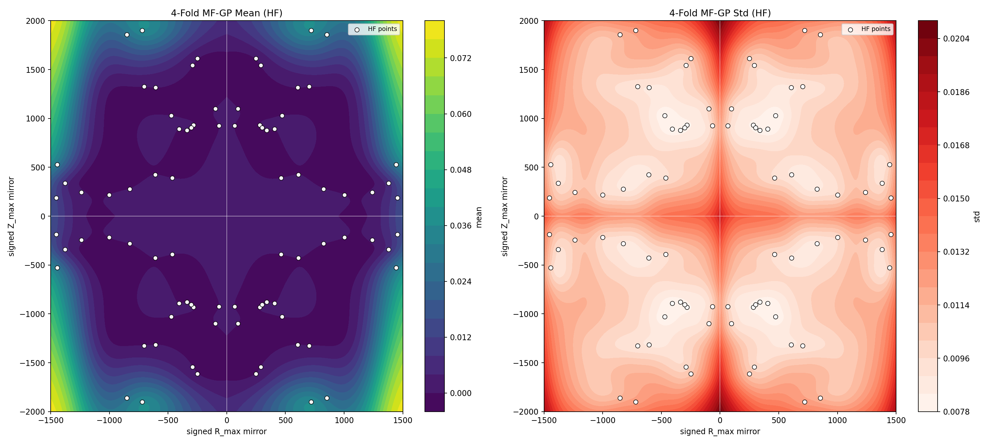


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline/mfgp_xlzd_v1_minibatch_baseline_linear_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


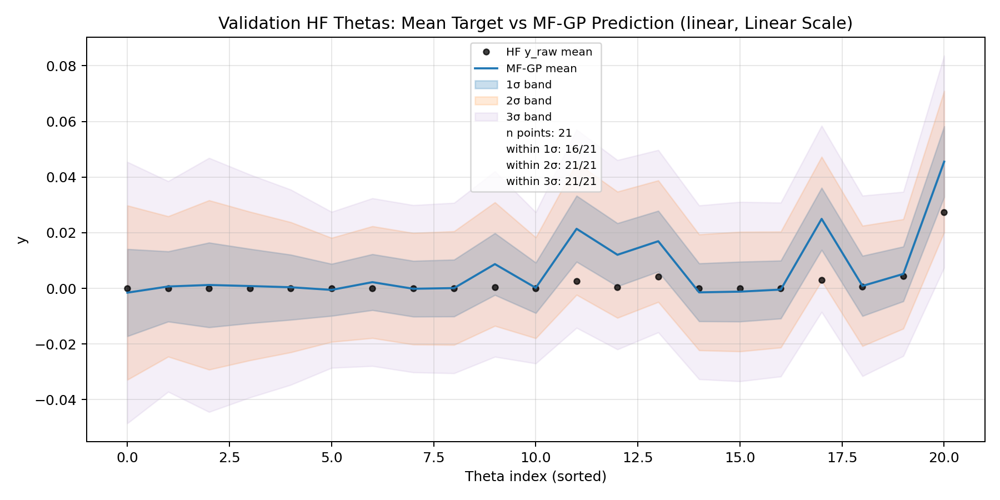


Validation 3-sigma: log10(y) with linear sigma


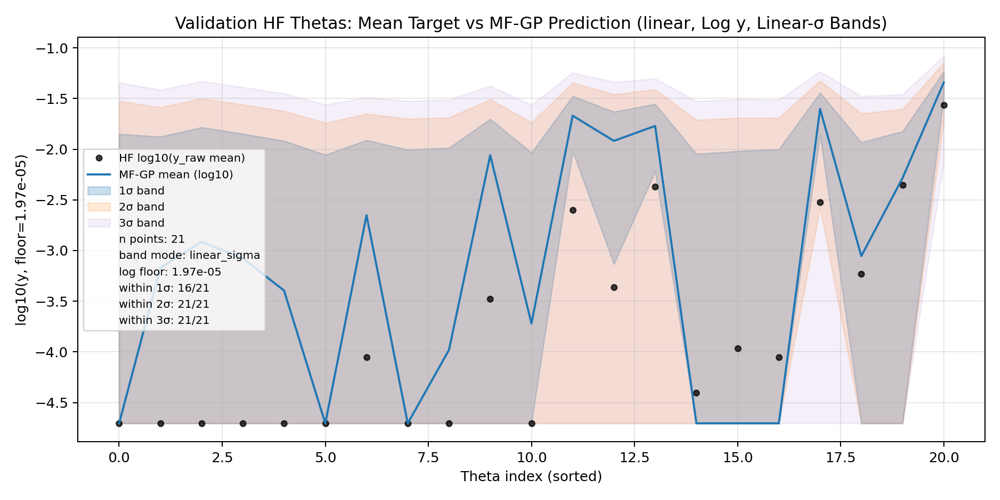


Validation parity


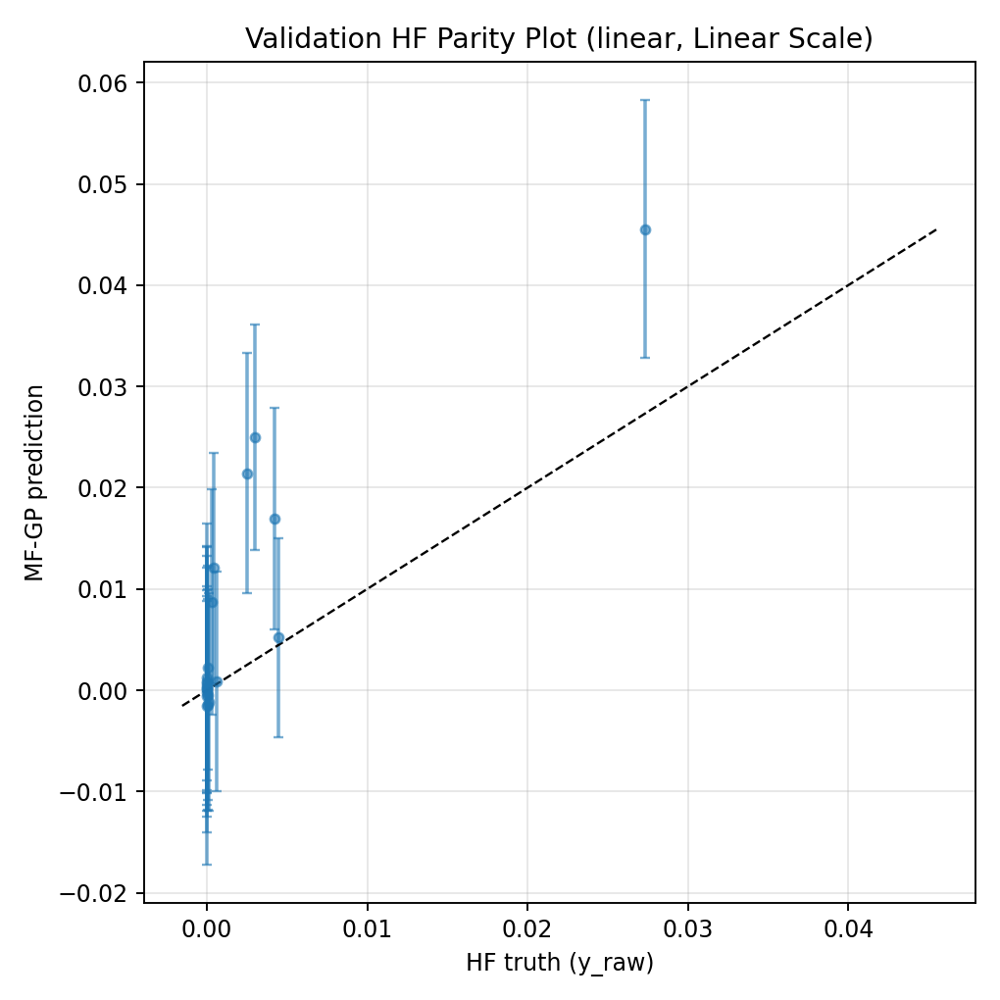

In [6]:
display_selected_mfgp_plots("baseline", "linear")


## 6. Baseline LF: Log HF


baseline: Log HF: emulate log10(y_raw)

4-fold MF-GP mean/std


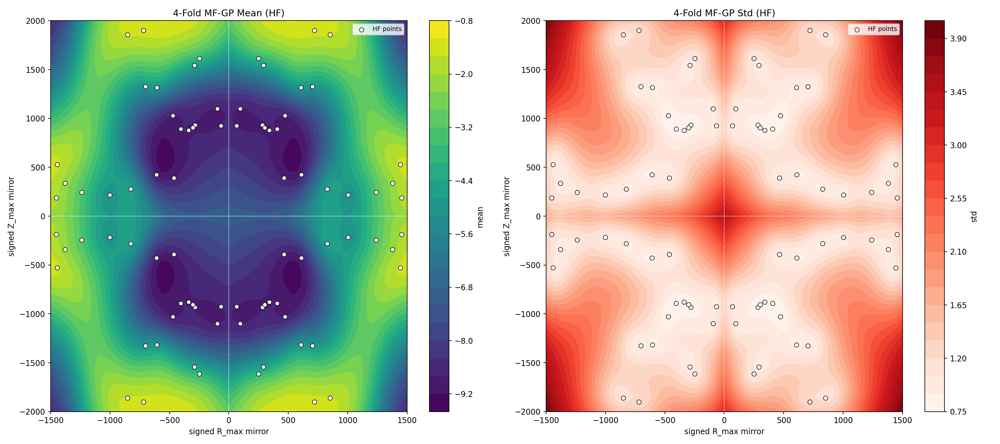


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline/mfgp_xlzd_v1_minibatch_baseline_log_hf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


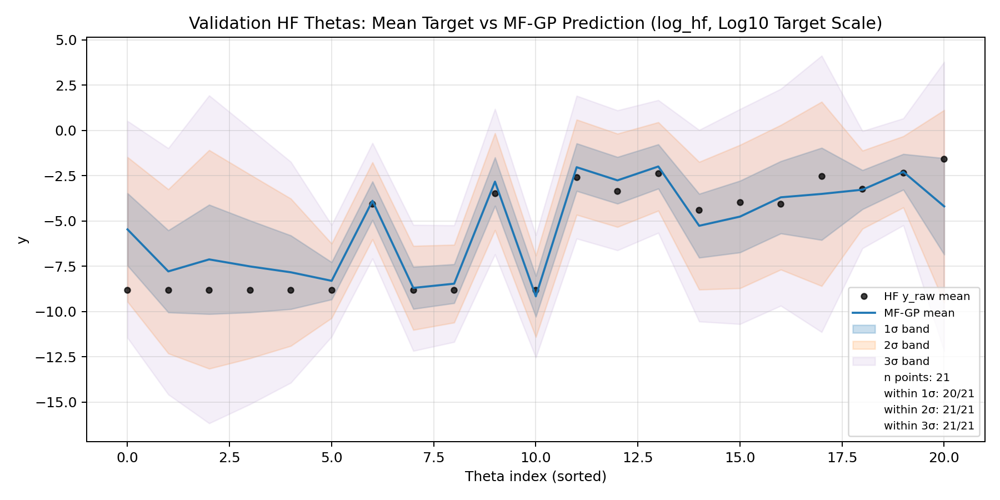


Validation parity


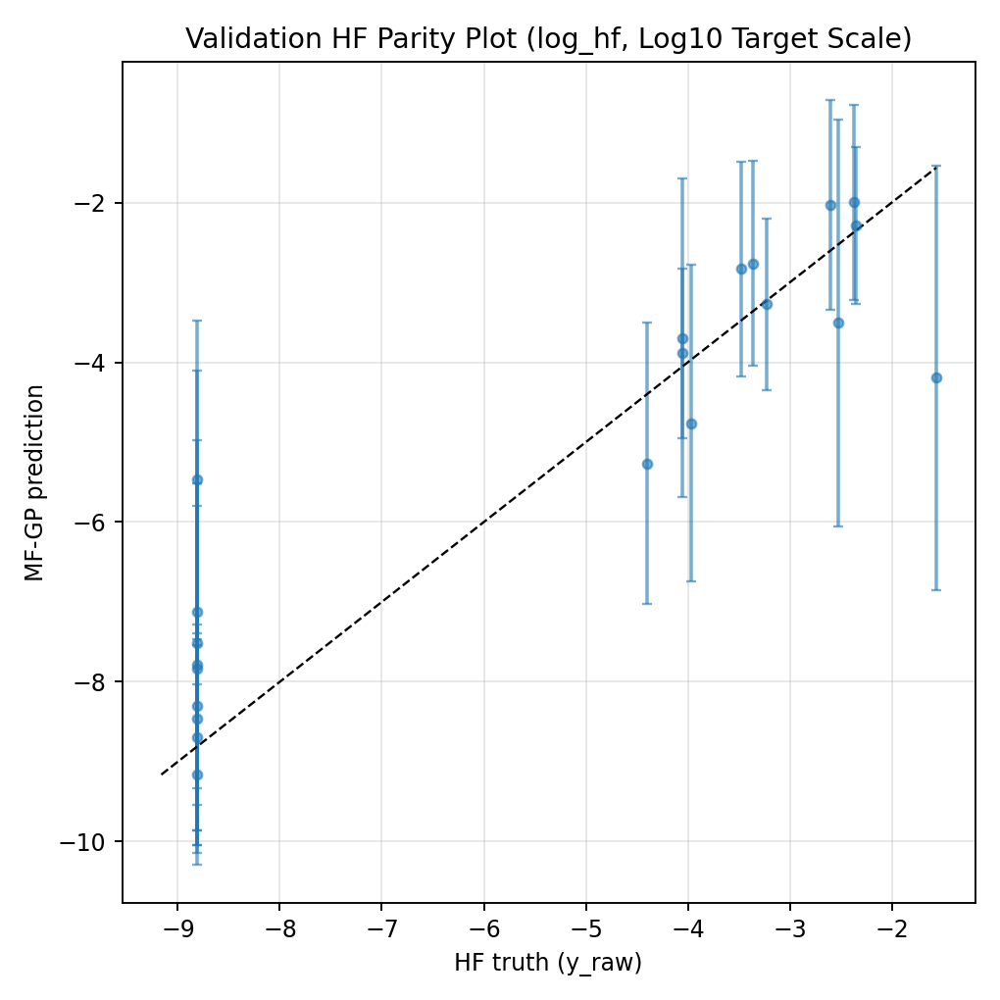

In [7]:
display_selected_mfgp_plots("baseline", "log_hf")


## 7. Baseline LF: Log LF


baseline: Log LF: use log10(y_cnp)

4-fold MF-GP mean/std


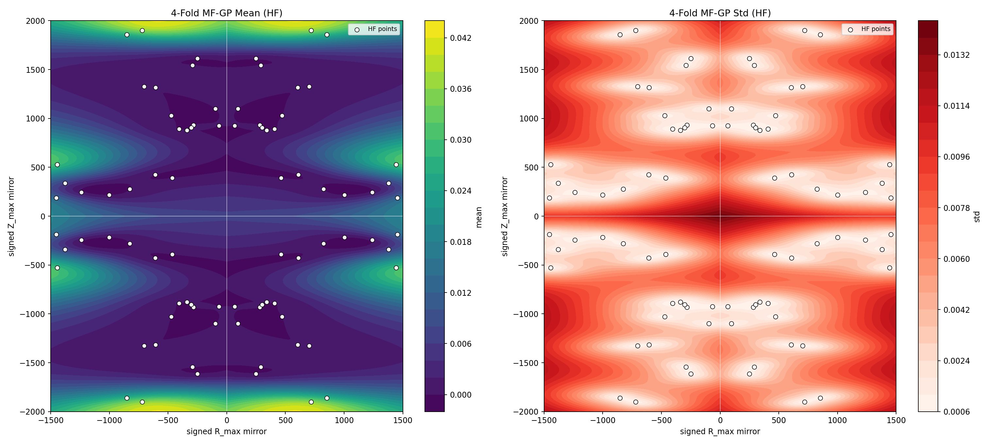


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline/mfgp_xlzd_v1_minibatch_baseline_log_lf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


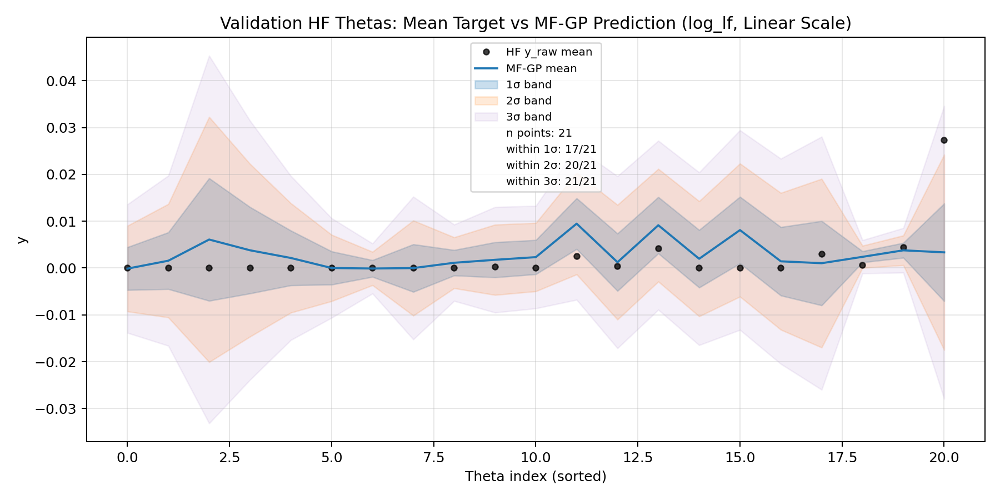


Validation 3-sigma: log10(y) with linear sigma


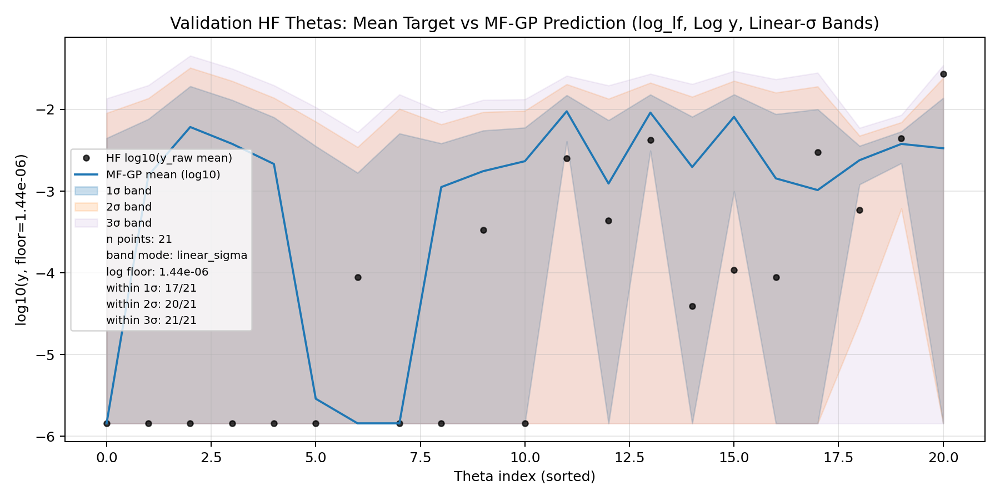


Validation parity


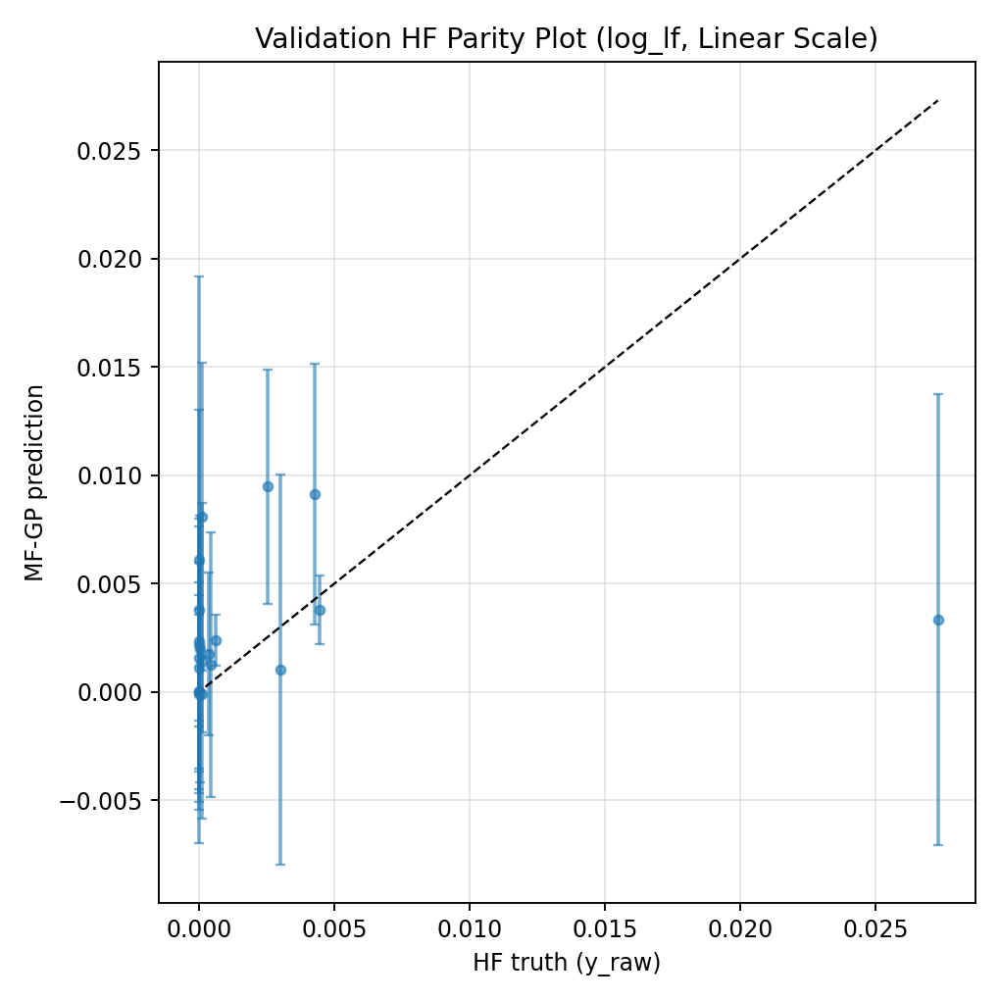

In [8]:
display_selected_mfgp_plots("baseline", "log_lf")


## 8. Baseline LF: Log HF + Log LF


baseline: Log HF + Log LF: use log10(y_raw) and log10(y_cnp)

4-fold MF-GP mean/std


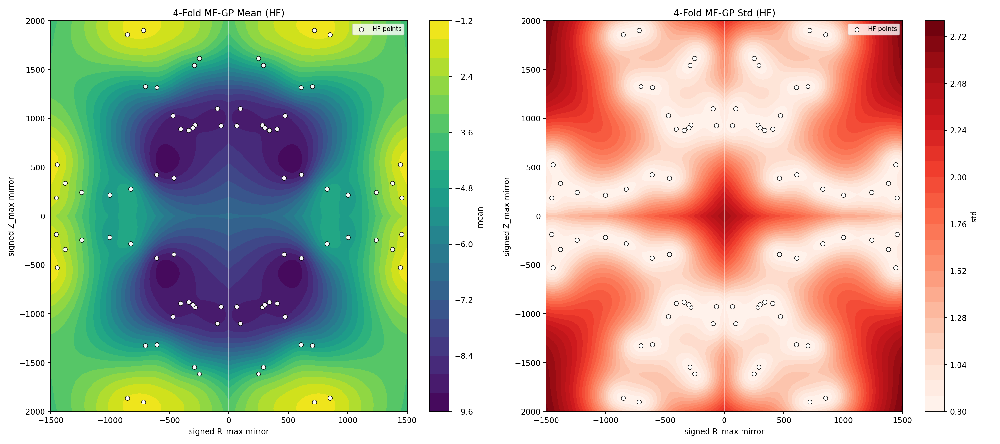


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_baseline/mfgp_xlzd_v1_minibatch_baseline_log_both_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


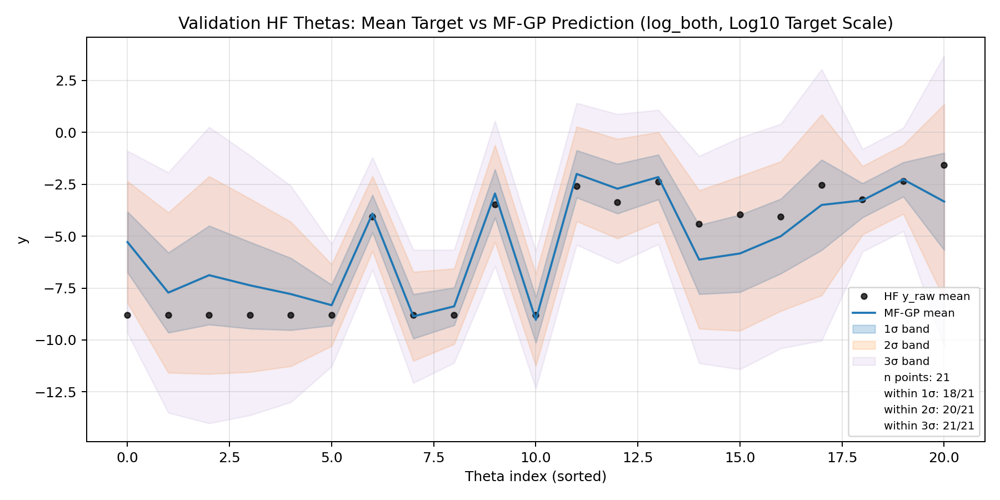


Validation parity


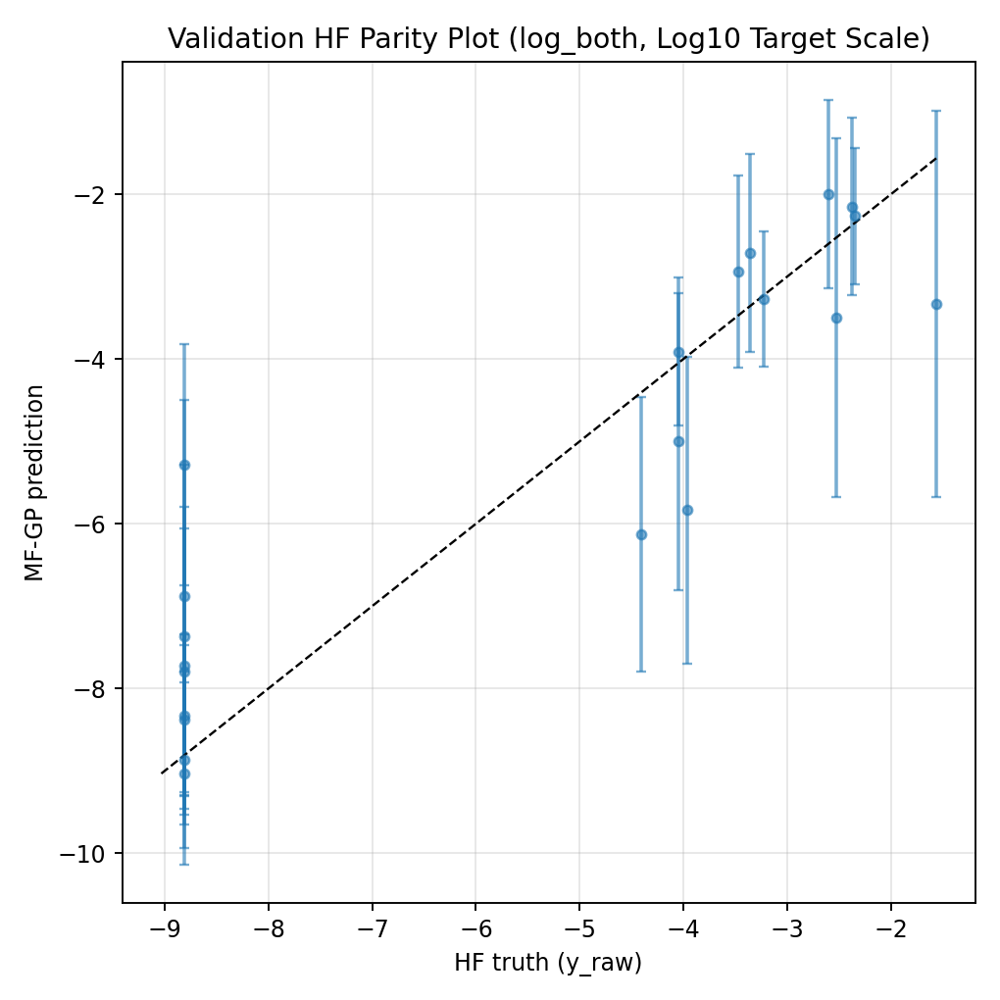

In [9]:
display_selected_mfgp_plots("baseline", "log_both")


## 9. Bootstrap LF Augmentation: Normal MF-GP


bootstrap: Normal MF-GP

4-fold MF-GP mean/std


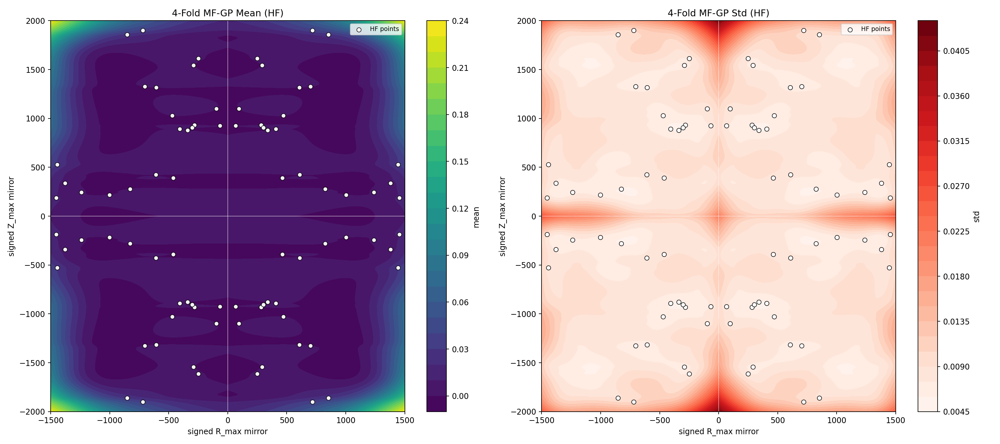


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap/mfgp_xlzd_v1_minibatch_lfbootstrap_linear_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


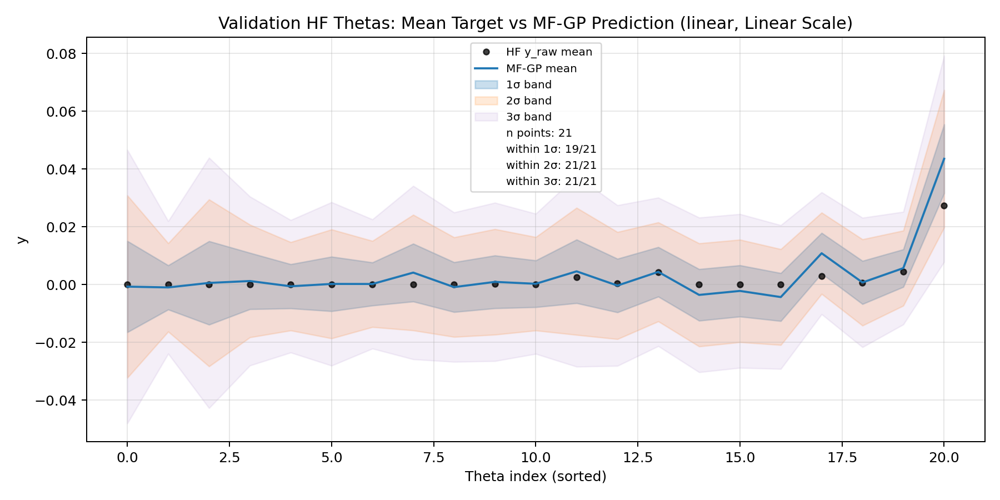


Validation 3-sigma: log10(y) with linear sigma


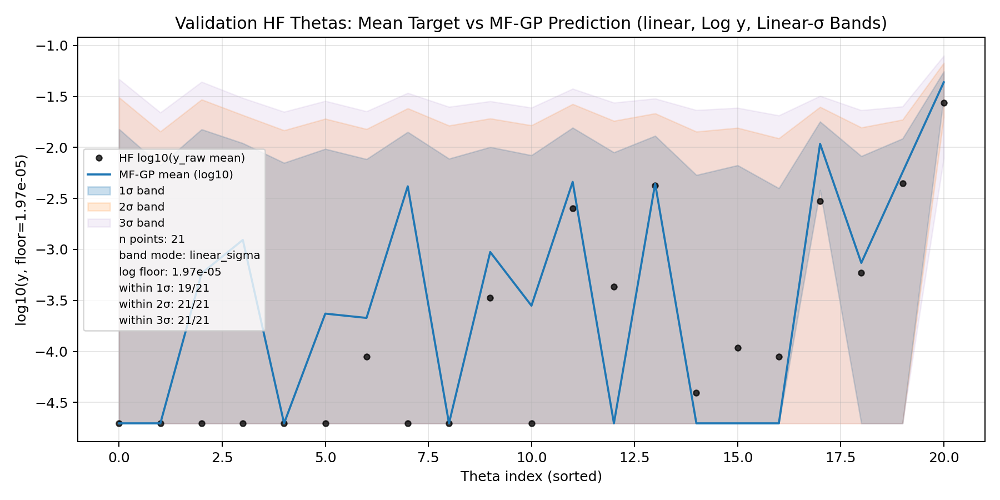


Validation parity


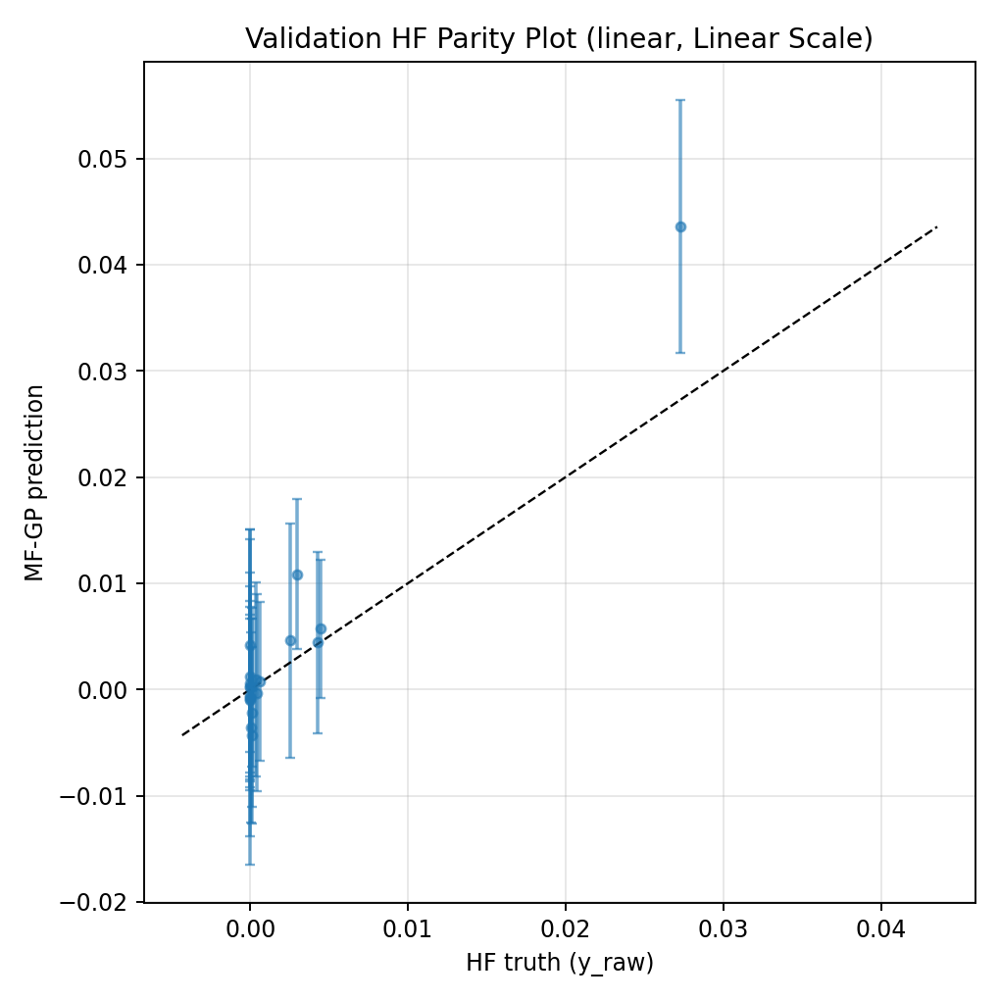

In [10]:
display_selected_mfgp_plots("bootstrap", "linear")


## 10. Bootstrap LF Augmentation: Log HF


bootstrap: Log HF: emulate log10(y_raw)

4-fold MF-GP mean/std


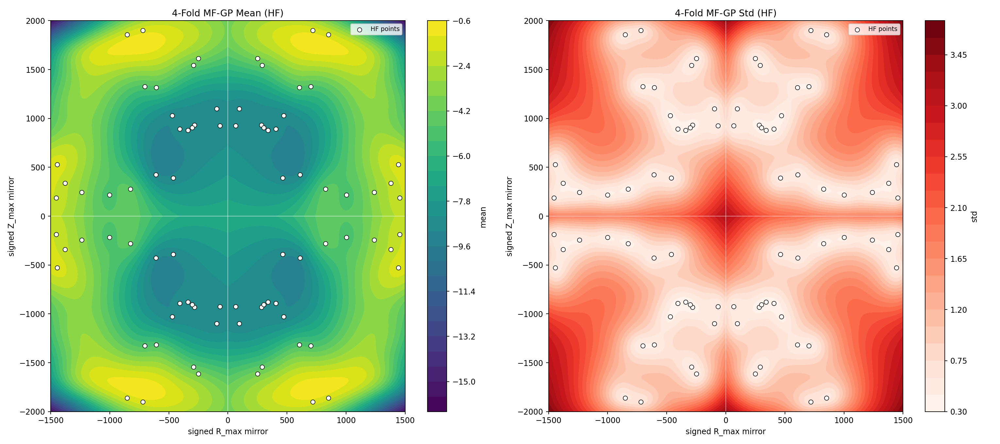


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap/mfgp_xlzd_v1_minibatch_lfbootstrap_log_hf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


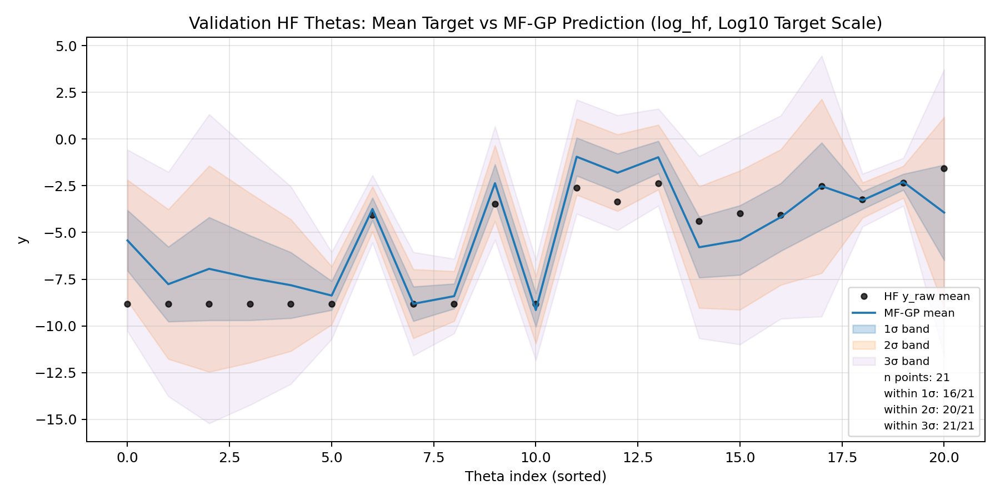


Validation parity


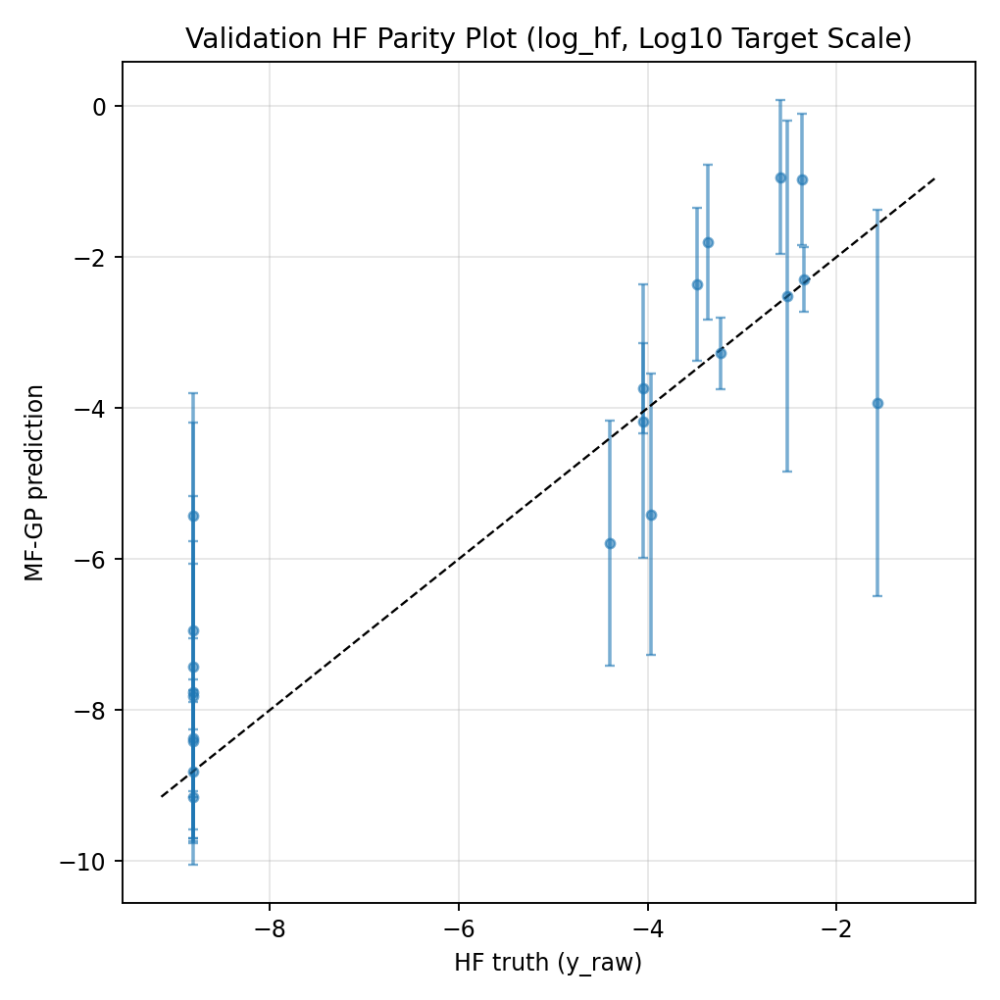

In [11]:
display_selected_mfgp_plots("bootstrap", "log_hf")


## 11. Bootstrap LF Augmentation: Log LF


bootstrap: Log LF: use log10(y_cnp)

4-fold MF-GP mean/std


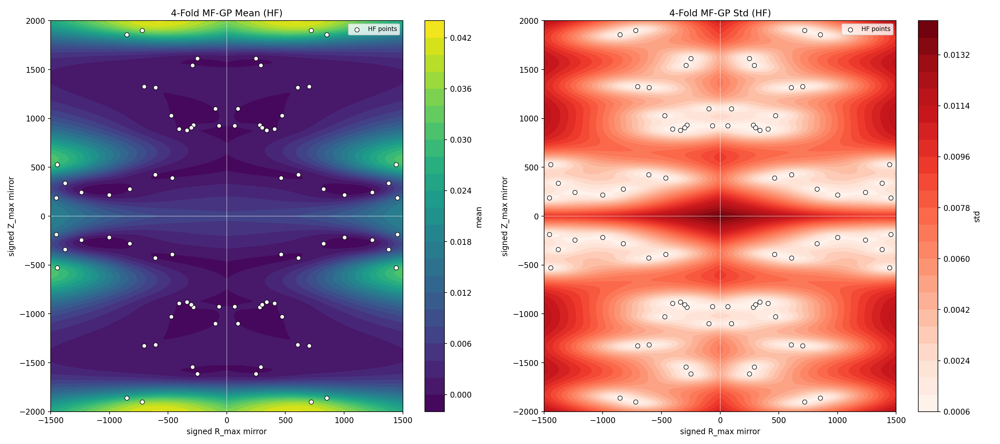


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap/mfgp_xlzd_v1_minibatch_lfbootstrap_log_lf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


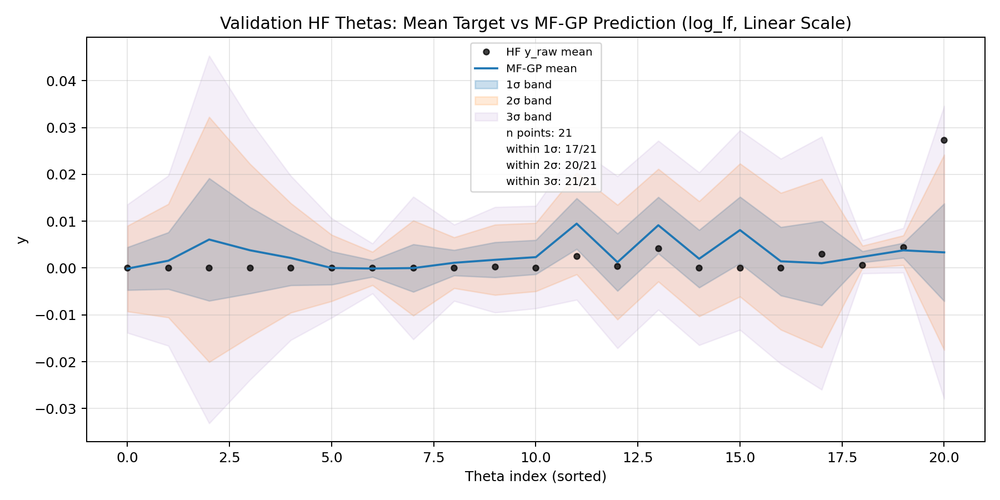


Validation 3-sigma: log10(y) with linear sigma


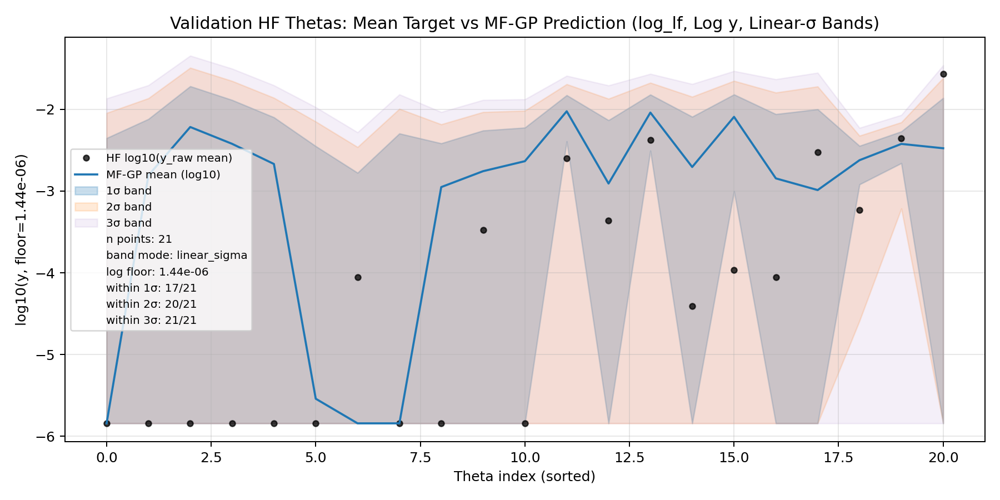


Validation parity


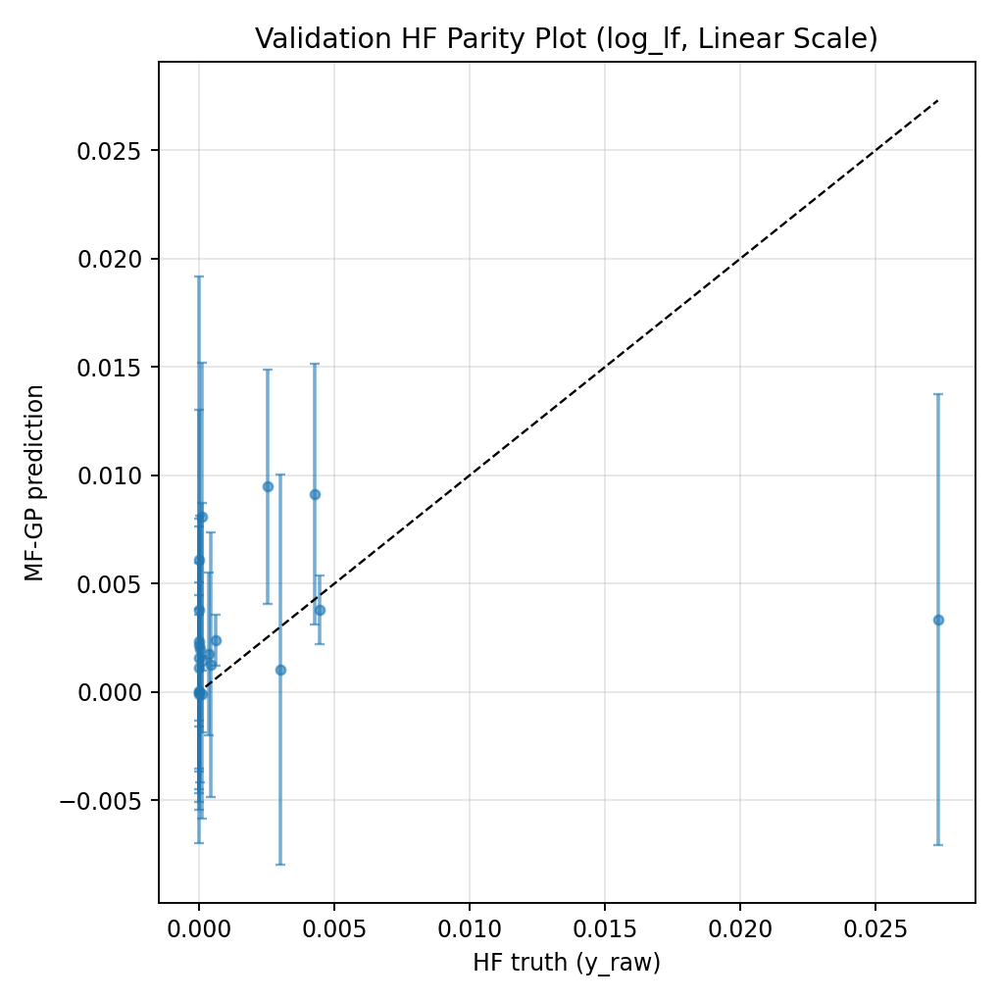

In [12]:
display_selected_mfgp_plots("bootstrap", "log_lf")


## 12. Bootstrap LF Augmentation: Log HF + Log LF


bootstrap: Log HF + Log LF: use log10(y_raw) and log10(y_cnp)

4-fold MF-GP mean/std


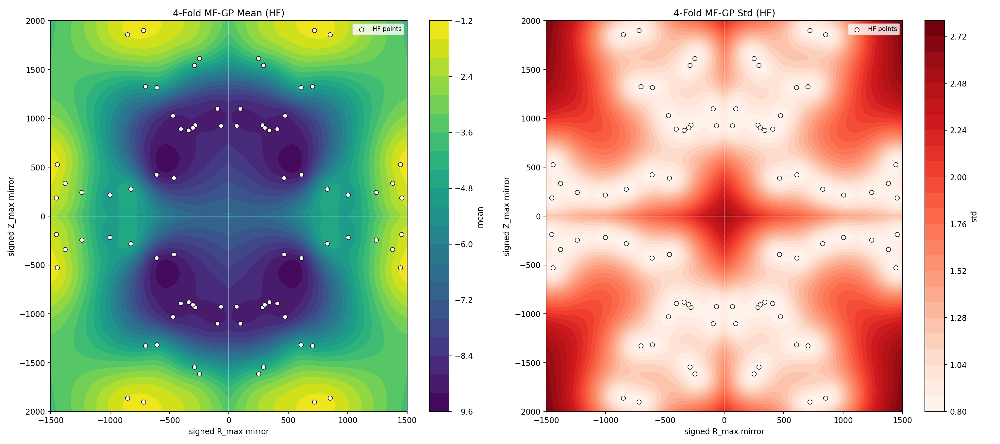


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_bootstrap/mfgp_xlzd_v1_minibatch_lfbootstrap_log_both_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


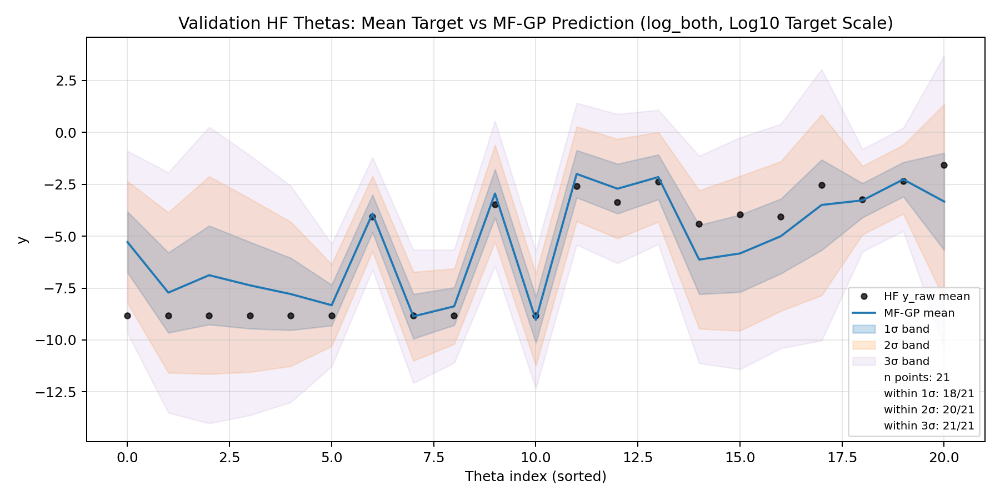


Validation parity


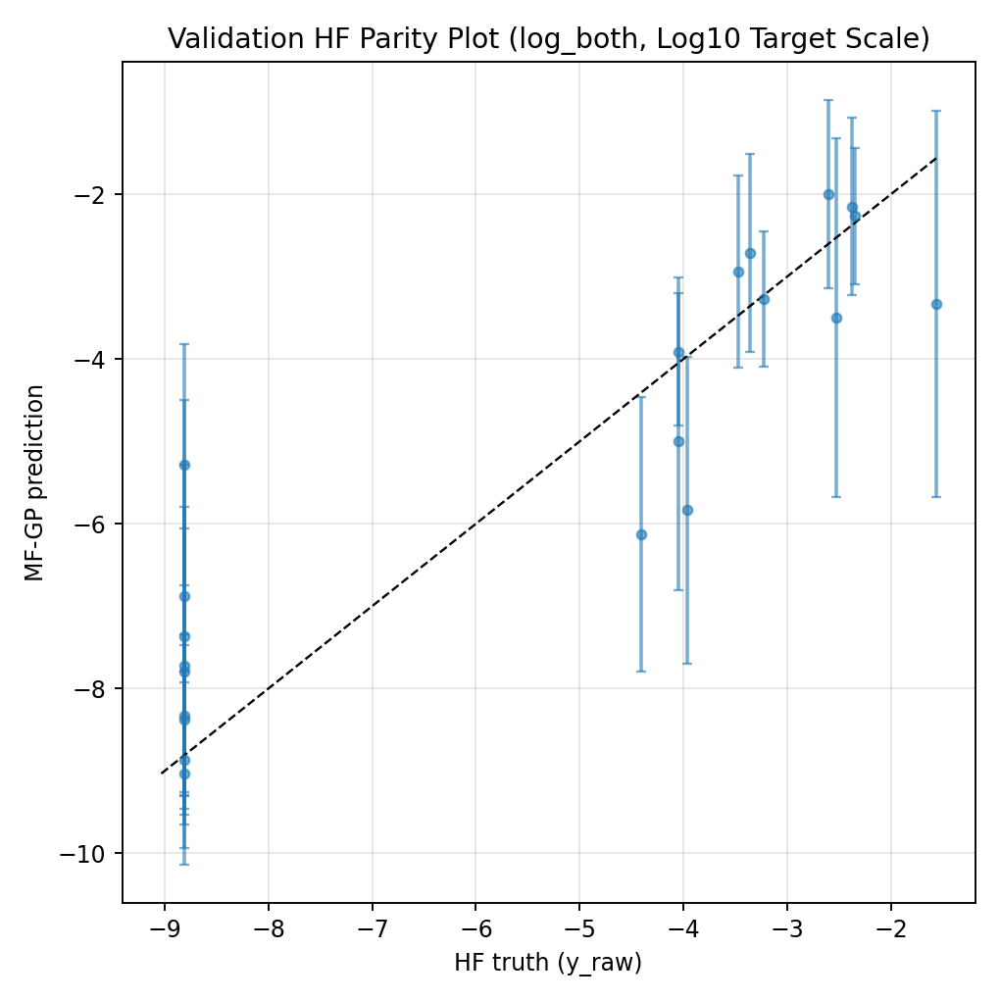

In [13]:
display_selected_mfgp_plots("bootstrap", "log_both")


## 13. Merged-Block LF Augmentation: Normal MF-GP


merged: Normal MF-GP

4-fold MF-GP mean/std


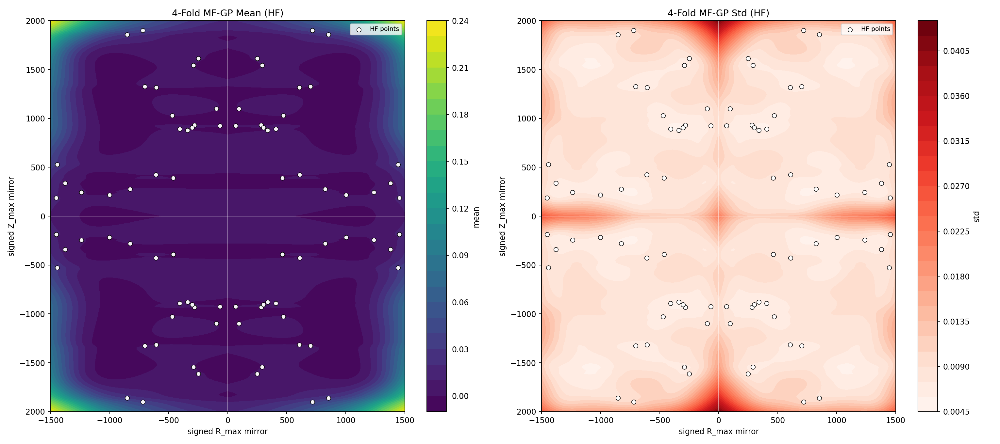


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged/mfgp_xlzd_v1_minibatch_lfmerged_linear_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


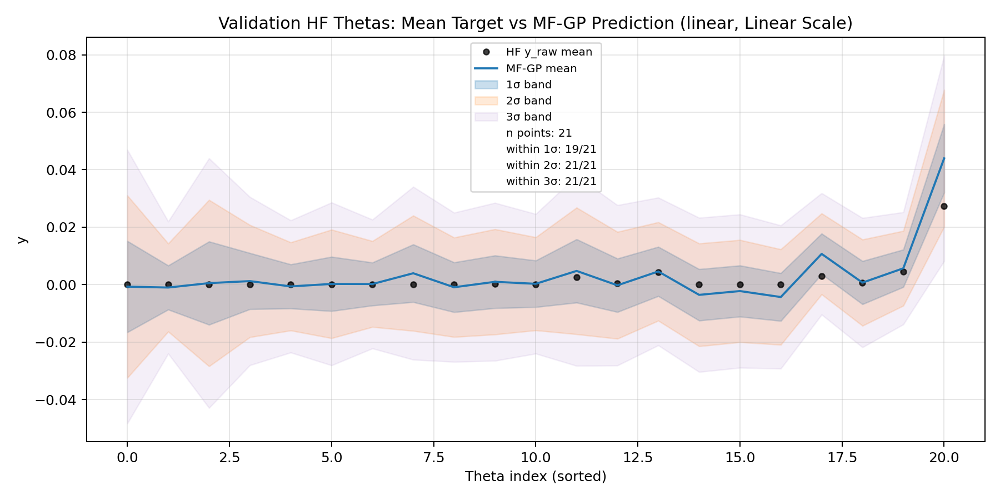


Validation 3-sigma: log10(y) with linear sigma


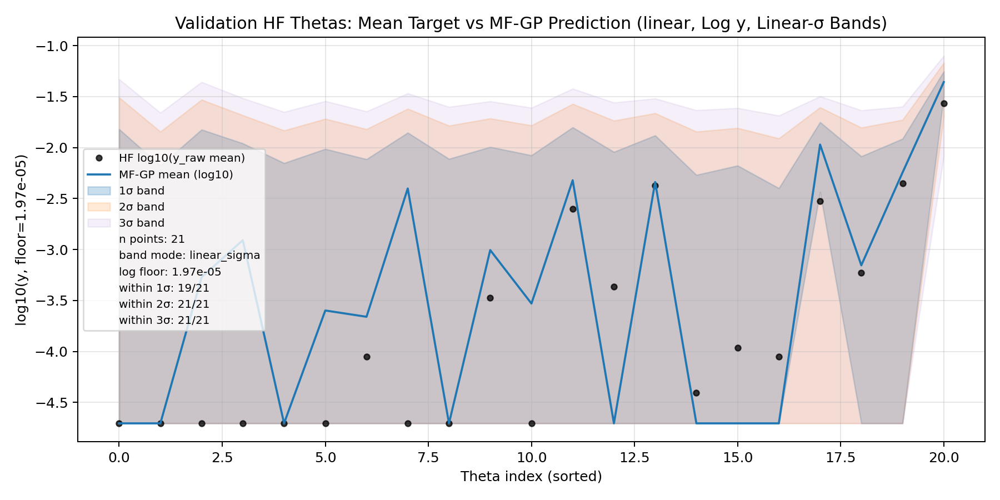


Validation parity


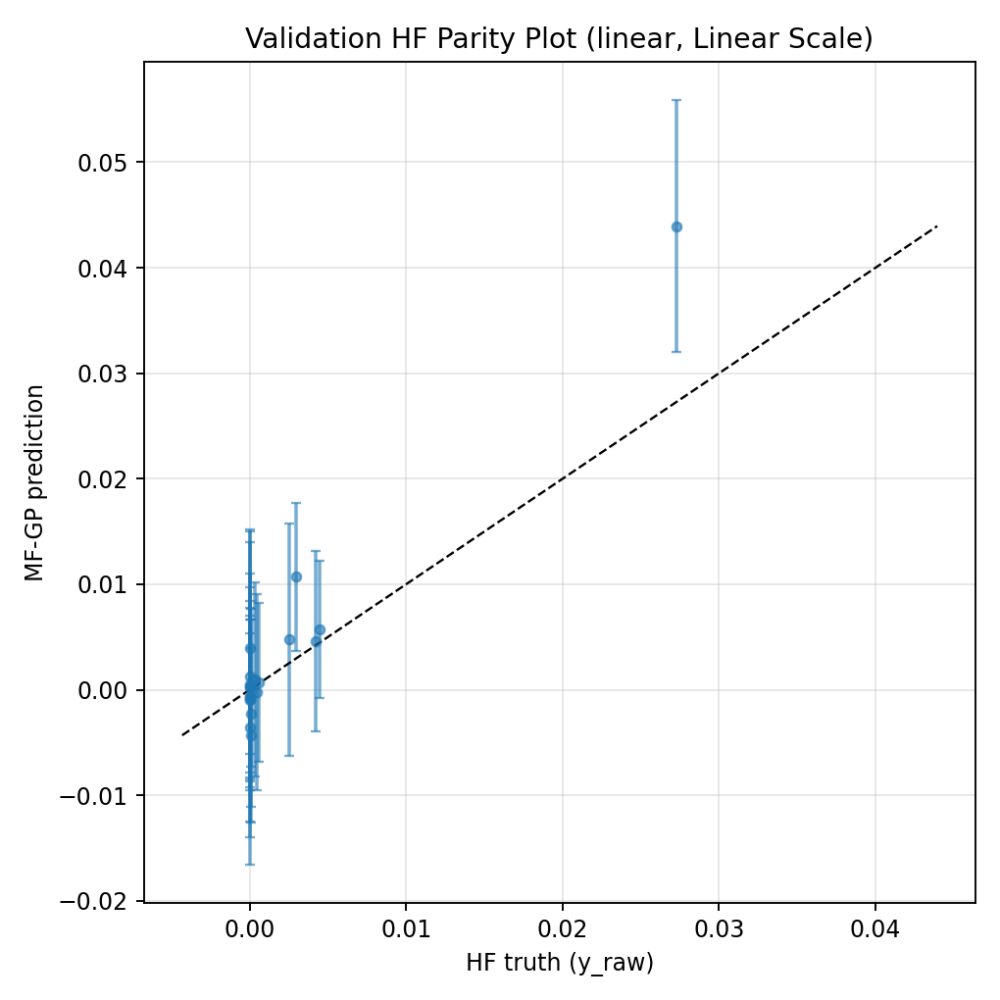

In [14]:
display_selected_mfgp_plots("merged", "linear")


## 14. Merged-Block LF Augmentation: Log HF


merged: Log HF: emulate log10(y_raw)

4-fold MF-GP mean/std


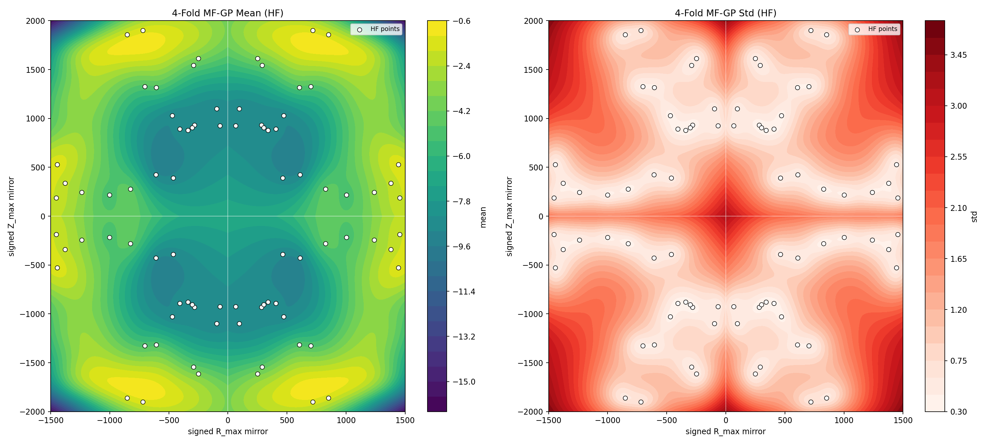


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged/mfgp_xlzd_v1_minibatch_lfmerged_log_hf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


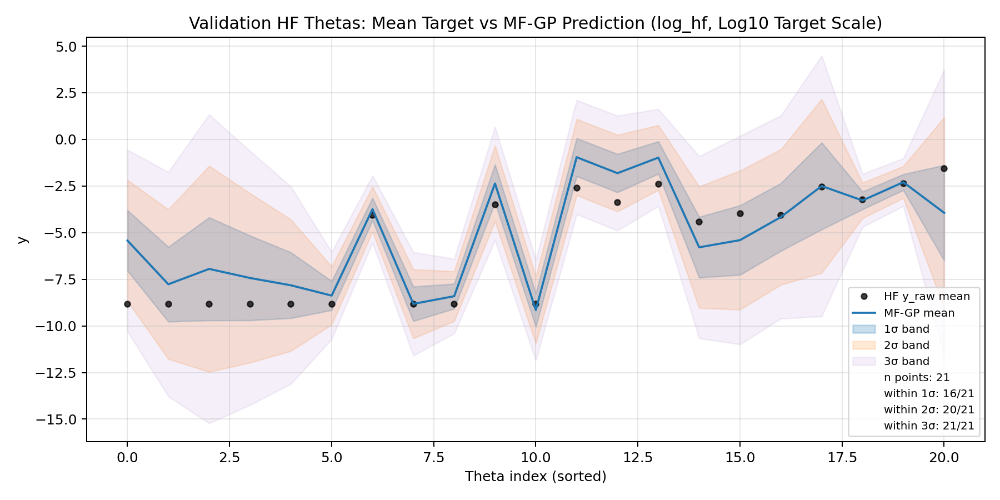


Validation parity


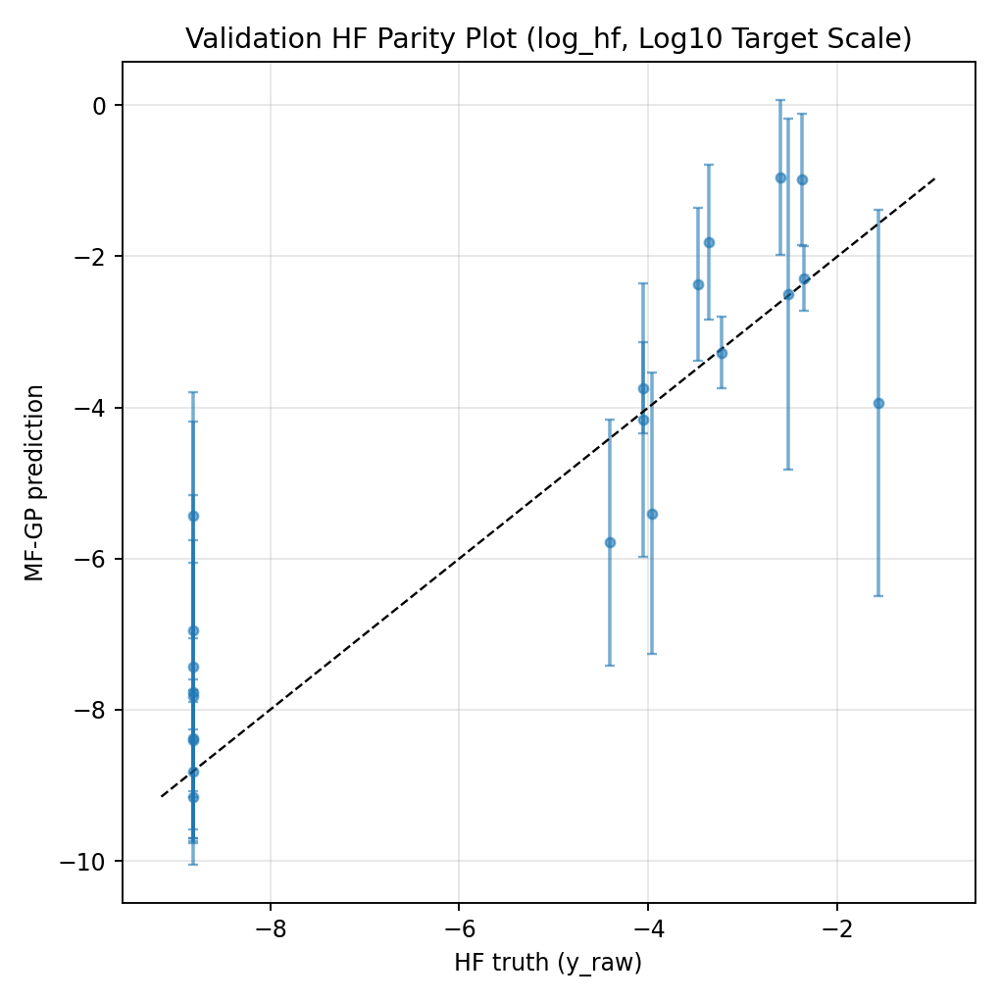

In [15]:
display_selected_mfgp_plots("merged", "log_hf")


## 15. Merged-Block LF Augmentation: Log LF


merged: Log LF: use log10(y_cnp)

4-fold MF-GP mean/std


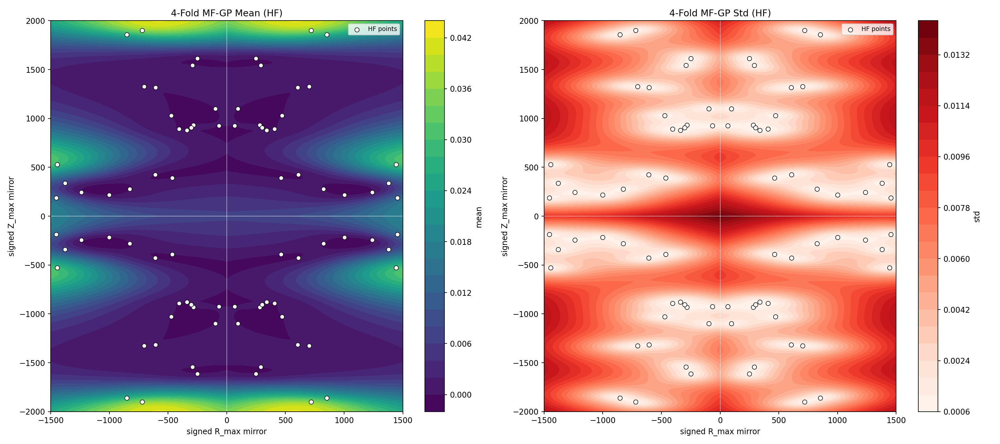


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged/mfgp_xlzd_v1_minibatch_lfmerged_log_lf_mean_std_3d_interactive_iter0.html

Validation 3-sigma: y with linear sigma


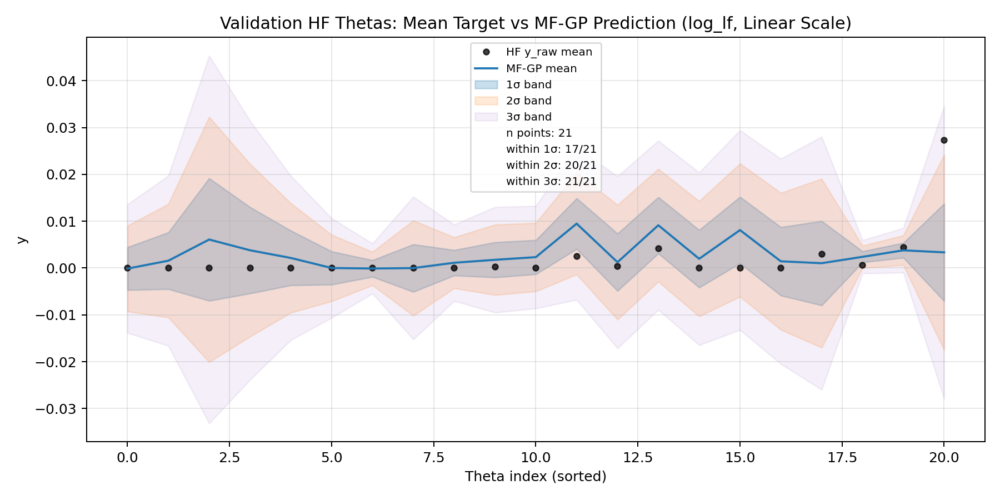


Validation 3-sigma: log10(y) with linear sigma


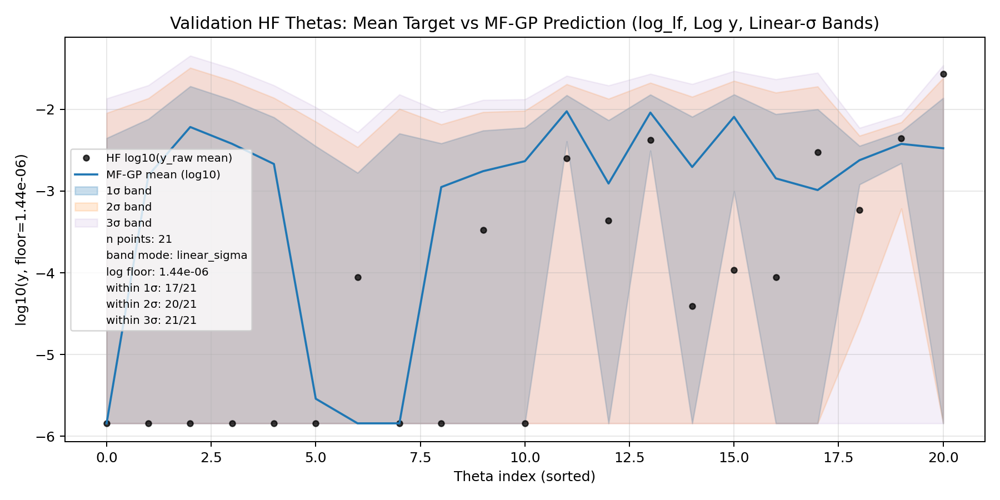


Validation parity


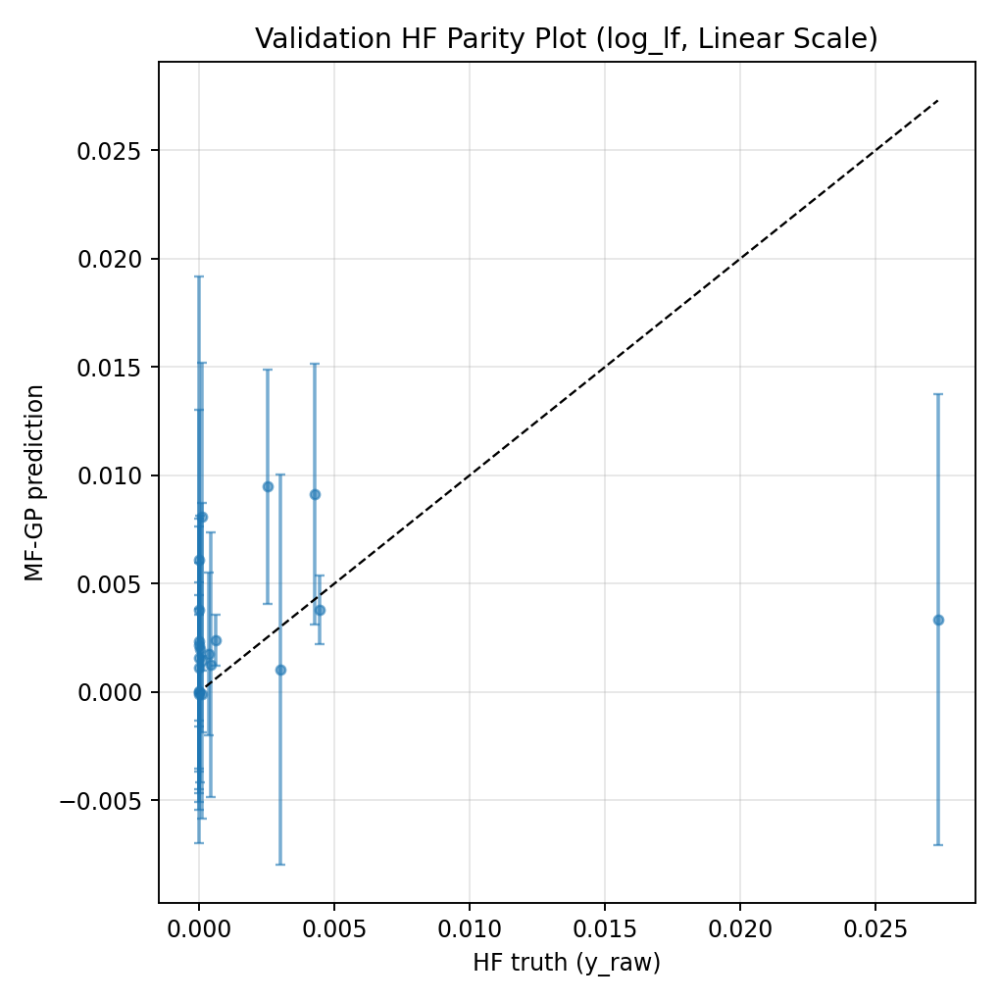

In [16]:
display_selected_mfgp_plots("merged", "log_lf")


## 16. Merged-Block LF Augmentation: Log HF + Log LF


merged: Log HF + Log LF: use log10(y_raw) and log10(y_cnp)

4-fold MF-GP mean/std


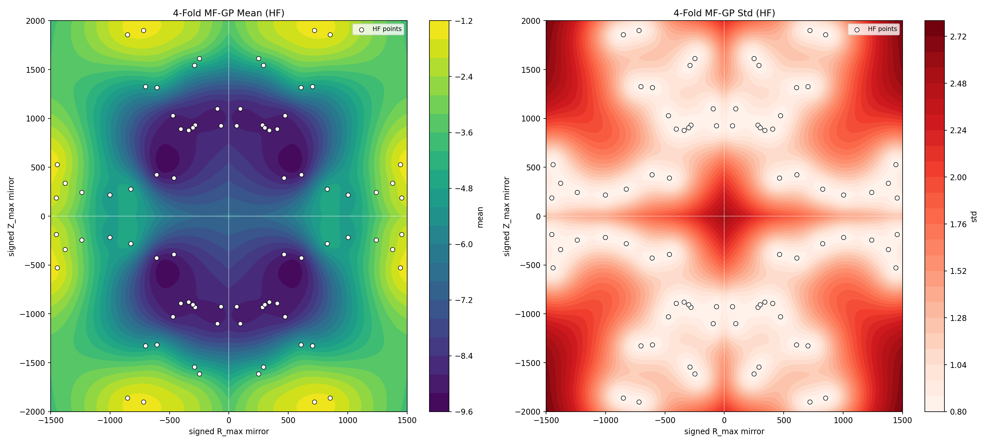


Interactive 3D mean/std HTML
Open manually: /home/klz/Data/XLZD/anpatnaik/lf_augmentations/artifacts/mfgp_merged/mfgp_xlzd_v1_minibatch_lfmerged_log_both_mean_std_3d_interactive_iter0.html

Validation 3-sigma: log10 target with linear sigma


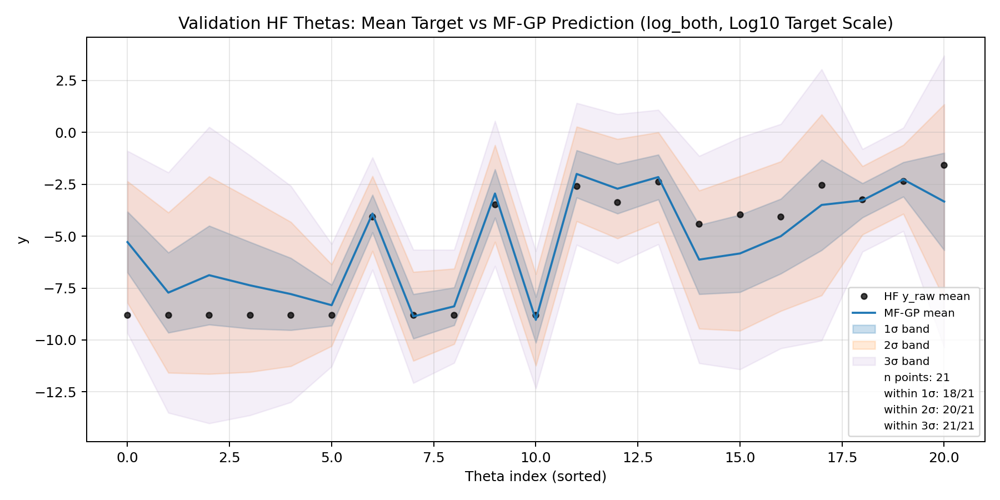


Validation parity


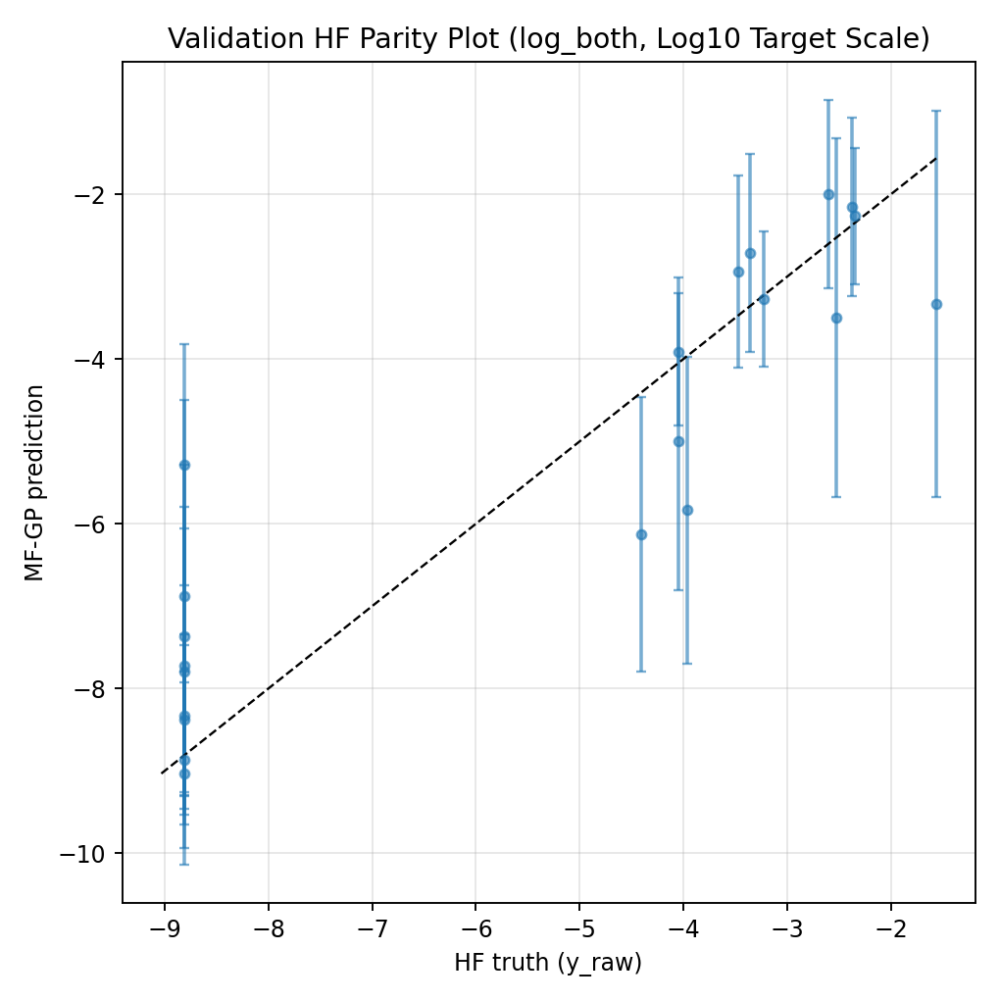

In [17]:
display_selected_mfgp_plots("merged", "log_both")


## 17. Optional: Inspect Per-Theta Validation Plot Directories


In [18]:
rows = []
for experiment_name, transform_map in all_mfgp_results.items():
    for mode, result in transform_map.items():
        rows.append({
            "experiment": experiment_name,
            "mode": mode,
            "theta_group_plot_dir": str(result.theta_group_plot_dir) if result.theta_group_plot_dir else None,
        })
display(pd.DataFrame(rows))


,experiment,mode,theta_group_plot_dir
0,baseline,linear,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
1,baseline,log_hf,NaN
2,baseline,log_lf,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
3,baseline,log_both,NaN
4,bootstrap,linear,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
5,bootstrap,log_hf,NaN
6,bootstrap,log_lf,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
7,bootstrap,log_both,NaN
8,merged,linear,/home/klz/Data/XLZD/anpatnaik/lf_augmentations...
9,merged,log_hf,NaN
